In [27]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))


/tmp/ipykernel_2043798/3391910190.py:1: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
  from IPython.core.display import display, HTML


In [28]:
import os
os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"   # see issue #152
os.environ["CUDA_VISIBLE_DEVICES"]="0,1,2,3"


In [26]:
label_dict.hierarchical_organization_single_cell_low_level

[['nucleoplasm'],
 ['nuclear bodies', 'nuclear speckles'],
 ['nucleoli', 'nucleoli fibrillar center'],
 ['nuclear membrane'],
 ['cytosol', 'aggresome', 'mitochondria'],
 ['intermediate filaments',
  'microtubule ends',
  'microtubules',
  'actin filaments,focal adhesion sites',
  'cytokinetic bridge'],
 ['microtubule organizing center', 'centrosome,centriolar satellite'],
 ['endoplasmic reticulum', 'golgi apparatus', 'vesicles'],
 ['focal adhesion sites', 'plasma membrane,cell junctions'],
 ['rods & rings',
  'peroxisomes',
  'endosomes',
  'lysosomes',
  'mitotic spindle',
  'lipid droplets',
  'vesicles,peroxisomes,endosomes,lysosomes,lipid droplets,cytoplasmic bodies',
  'no staining']]

In [40]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
import matplotlib
import pandas as pd
from sklearn.metrics import confusion_matrix
import scanpy as sc
import yaml
import torch
from scipy.sparse.linalg import eigs
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
from scipy.spatial.distance import pdist, cdist
from seaborn import clustermap
from scipy.spatial.distance import squareform
from sklearn.cross_decomposition import CCA
from sklearn import datasets
from sklearn import decomposition
from sklearn.preprocessing import StandardScaler
import mantel
from sknetwork.clustering import Louvain
from sklearn.cluster import DBSCAN
import harmonypy as hm
from harmony import harmonize
font = {'size'   : 9}
matplotlib.rc('font', **font)
from matplotlib import cm
cmap = cm.nipy_spectral
import label_dict
from label_dict import protein_to_num_single_cells, protein_to_num_full
import matplotlib.patches as patches


def create_protein_hierarchy(config_file, label_type, label, feature_type='full', apply_pca=True):
    if label_type == 'single_cells':
        labels = protein_to_num_single_cells
        low_level_labels = label_dict.hierarchical_organization_single_cell_low_level
        high_level_labels = label_dict.hierarchical_organization_single_cell_high_level
    elif label_type == 'whole_image':
        labels = protein_to_num_full
        low_level_labels = label_dict.hierarchical_organization_whole_image_low_level
        high_level_labels = label_dict.hierarchical_organization_whole_image_high_level        
        
    config = yaml.safe_load(open(config_file, "r"))
    df = pd.read_csv(config['embedding']['df_path'])
    if feature_type=='full':
        features, protein_localizations, cell_lines, IDs = torch.load(config['embedding']['output_path'])    
    elif feature_type=='average':
        features, protein_localizations, cell_lines, IDs = torch.load(config['embedding']['output_path'])    
        mean_df = pd.DataFrame(pd.concat((pd.DataFrame(features, columns=[f'f_{i}' for i in range(len(features[0]))]),
                               pd.DataFrame(IDs, columns=['ID'])), 
                               axis=1)).groupby('ID')
        mean_features = mean_df.mean()[[f'f_{i}' for i in range(len(features[0]))]].values
        features = torch.Tensor(mean_features)
        df = df.groupby('ID').first().reset_index()
    elif feature_type=='max':
        features, protein_localizations, cell_lines, IDs = torch.load(config['embedding']['output_path'])    
        max_df = pd.DataFrame(pd.concat((pd.DataFrame(features, columns=[f'f_{i}' for i in range(len(features[0]))]),
                               pd.DataFrame(IDs, columns=['ID'])), 
                               axis=1)).groupby('ID')
        max_features = max_df.max()[[f'f_{i}' for i in range(len(features[0]))]].values
        features = torch.Tensor(max_features)
        df = df.groupby('ID').first().reset_index()
    else:
        print(f'{feature_type} is not a known feature type, try again!')
        return


    scaled_features, features_mean, features_std = scale(features)
    protein_averaged_features, protein_columns = get_averaged_features(df, torch.Tensor(scaled_features), labels)
    protein_distance_matrix = 1 - squareform(pdist(protein_averaged_features, metric='cosine'))

    scaled_averaged_features, features_mean, features_std = scale(protein_averaged_features)
    if apply_pca:
        pca = decomposition.PCA(n_components=10)
        protein_averaged_features = pca.fit_transform(protein_averaged_features)
    protein_distance_matrix = 1 - squareform(pdist(protein_averaged_features, metric='cosine'))
    
    ground_truth_distance_matrix = np.zeros(protein_distance_matrix.shape)
    for g in high_level_labels:
        inner_indices = []
        for l in g:
            index = np.where(np.array(protein_columns) == l)[0]
            if len(index) > 0:
                inner_indices.append(index[0])
        for i in inner_indices:
            for j in inner_indices:
                ground_truth_distance_matrix[i][j] = 0.5            
    for g in low_level_labels:
        inner_indices = []
        for l in g:
            index = np.where(np.array(protein_columns) == l)[0]
            if len(index) > 0:
                inner_indices.append(index[0])
        for i in inner_indices:
            for j in inner_indices:
                ground_truth_distance_matrix[i][j] = 1
    ground_truth_Z = linkage(ground_truth_distance_matrix)
    
    Z = linkage(protein_distance_matrix)
    dflt_col = "#808080"
    D_leaf_colors = {}
    
    colors = [cmap(i) for i in np.linspace(0, 1, len(low_level_labels))]
    for ind, g in enumerate(low_level_labels):
        for l in g:
            if l in protein_columns:
                D_leaf_colors[l] = colors[ind][:3]
    
    link_cols = {}
    for i, _ in enumerate(Z[:,:2].astype(int)):
        link_cols[i+1+len(Z)] = dflt_col
    
    # Dendrogram
    fig, ax = plt.subplots(figsize=(15,2.5), dpi=300)
    D = dendrogram(Z=Z, labels=sorted(protein_columns), color_threshold=None,
      leaf_font_size=12, leaf_rotation=90, link_color_func=lambda x: link_cols[x])
    plt.yticks([])
    for ind, l in enumerate(D['ivl']):
        ax.get_xticklabels()[ind].set_color(D_leaf_colors[l])

    plt.figure()
    dn = dendrogram(ground_truth_Z, labels = protein_columns)
    ground_truth_distance_matrix = ground_truth_distance_matrix[dn['leaves'], :][:, dn['leaves']]
    protein_distance_matrix = protein_distance_matrix[dn['leaves'], :][:, dn['leaves']]
    ground_truth_Z = linkage(ground_truth_distance_matrix)
    high_level_clusters = fcluster(ground_truth_Z, criterion='distance', t=2)
    low_level_clusters = fcluster(ground_truth_Z, criterion='distance', t=0.5)
    high_level_groups = pd.DataFrame(high_level_clusters).groupby(0).groups
    low_level_groups = pd.DataFrame(low_level_clusters).groupby(0).groups
    high_level_groups = {k : [high_level_groups[k].min(), high_level_groups[k].max()] for k in high_level_groups.keys()}
    low_level_groups = {k : [low_level_groups[k].min(), low_level_groups[k].max()] for k in low_level_groups.keys()}
    
    columns = dn['ivl']
    plt.figure(figsize=(5,5), dpi=300)
    plt.imshow(ground_truth_distance_matrix, cmap='Blues')
    plt.title(f'{label} - Protein ground truth matrix')
    plt.xticks(range(len(columns)), columns, rotation=90)
    plt.yticks(range(len(columns)), columns)
    print('')

    plt.figure()
    fig, ax = plt.subplots(figsize=(5,5), dpi=300)
    plt.imshow(protein_distance_matrix, cmap='Blues')
    plt.title(f'{label} - DINO similarity matrix')
    plt.xticks(range(len(columns)), columns, rotation=90)
    plt.yticks(range(len(columns)), columns)
    for r in high_level_groups.keys():
        min_index, max_index = high_level_groups[r]
        rect = patches.Rectangle((min_index - 0.5, min_index - 0.5), 
                                 max_index - min_index + 1, 
                                 max_index - min_index + 1, 
                                 linewidth=4, 
                                 edgecolor='#00ff00', 
                                 facecolor='none')
        ax.add_patch(rect)
    for r in low_level_groups.keys():
        min_index, max_index = low_level_groups[r]
        rect = patches.Rectangle((min_index - 0.5, min_index - 0.5), 
                                 max_index - min_index + 1, 
                                 max_index - min_index + 1, 
                                 linewidth=4, 
                                 edgecolor='#ff0000', 
                                 facecolor='none')    
        ax.add_patch(rect)
    print('')

    for i in range(len(protein_distance_matrix)):
        protein_distance_matrix[i,i] = 0
        ground_truth_distance_matrix[i,i] = 0
        
    mantel_test = mantel.test(squareform(protein_distance_matrix), squareform(ground_truth_distance_matrix))
    print(f"{label}, protein hierarchy mantel test: {mantel_test}")
    protein_hierarchy_mantel_test = mantel_test[0]
    return protein_hierarchy_mantel_test

def scale(features, features_mean=None, features_std=None):
    if features_mean is None:
        features_mean = features.mean(axis=0)
    if features_std is None:
        features_std = features.std(axis=0)
    transformed_features = (features - features_mean) / (features_std + 0.00001)
    return transformed_features, features_mean, features_std


def get_averaged_features(df, features, labels, sort=True):
    mat, columns = get_col_matrix(df, labels)
    averaged_features = []
    for key in range(len(columns)):
        indices = np.where((mat[:,key] == 1) & (mat.sum(axis=1) == 1))
        averaged_features.append(features[indices].mean(axis=0))
    averaged_features = torch.stack(averaged_features)
    return averaged_features, columns


def get_col_matrix(df, labels):
    if len(labels) == 1:
        values = df[labels[0]]
        unique_values = sorted(np.unique(values))
        mat = np.zeros((len(df), len(unique_values)))
        for ind, value in enumerate(unique_values):
            mat[np.where(values == value)[0], ind] = 1
        columns = unique_values
    else:
        mat = df[sorted(labels)].values.astype(int)
        columns = sorted(labels)
    return mat, columns


def create_cell_comparison(config_file, label, apply_pca=True, feature_type='full'):
    config = yaml.safe_load(open(config_file, "r"))
    df = pd.read_csv(config['embedding']['df_path'])
    if feature_type=='full':
        features, protein_localizations, cell_lines, IDs = torch.load(config['embedding']['output_path'])    
    elif feature_type=='average':
        features, protein_localizations, cell_lines, IDs = torch.load(config['embedding']['output_path'])    
        mean_df = pd.DataFrame(pd.concat((pd.DataFrame(features, columns=[f'f_{i}' for i in range(len(features[0]))]),
                               pd.DataFrame(IDs, columns=['ID'])), 
                               axis=1)).groupby('ID')
        mean_features = mean_df.mean()[[f'f_{i}' for i in range(len(features[0]))]].values
        features = torch.Tensor(mean_features)
        df = df.groupby('ID').first().reset_index()
    elif feature_type=='max':
        features, protein_localizations, cell_lines, IDs = torch.load(config['embedding']['output_path'])    
        max_df = pd.DataFrame(pd.concat((pd.DataFrame(features, columns=[f'f_{i}' for i in range(len(features[0]))]),
                               pd.DataFrame(IDs, columns=['ID'])), 
                               axis=1)).groupby('ID')
        max_features = max_df.max()[[f'f_{i}' for i in range(len(features[0]))]].values
        features = torch.Tensor(max_features)
        df = df.groupby('ID').first().reset_index()
    
    averaged_features, cell_columns = get_averaged_features(df, features, ['cell_type'], sort=True)
    path_to_rna = '/scr/mdoron/Dino4Cells/rna_cellline.tsv'
    rna = pd.read_csv(path_to_rna, delimiter="\t")
    tpms = []
    for cell_line in cell_columns:
        df = rna[rna["Cell line"] == cell_line]
        tpms.append(df.TPM.to_numpy())
    tpms = np.array(tpms)
    scaled_tpms, features_mean, features_std = scale(tpms)
    scaled_averaged_features, features_mean, features_std = scale(averaged_features)
    
    if apply_pca:
        pca = decomposition.PCA(n_components=10)
        scaled_tpms = pca.fit_transform(scaled_tpms)
        scaled_averaged_features = pca.fit_transform(scaled_averaged_features)

    reduced_rna_matrix = 1 - squareform(pdist(scaled_tpms, metric='cosine'))
    reduced_averaged_features = 1 - squareform(pdist(scaled_averaged_features, metric='cosine'))
    plt.figure()
    ground_truth_Z = linkage(reduced_rna_matrix)
    dn = dendrogram(ground_truth_Z, labels = cell_columns)
    reduced_rna_matrix = reduced_rna_matrix[dn['leaves'], :][:, dn['leaves']]
    reduced_averaged_features = reduced_averaged_features[dn['leaves'], :][:, dn['leaves']]

    columns = dn['ivl']
    plt.figure(figsize=(5,5), dpi=300)
    plt.imshow(reduced_rna_matrix, cmap='Blues')
    plt.title(f'{label} - RNASeq distance matrix')
    plt.xticks(range(len(columns)), columns, rotation=90)
    plt.yticks(range(len(columns)), columns)
    print('')

    plt.figure()
    plt.figure(figsize=(5,5), dpi=300)
    plt.imshow(reduced_averaged_features, cmap='Blues')
    plt.title(f'{label} - DINO similarity matrix')
    plt.xticks(range(len(columns)), columns, rotation=90)
    plt.yticks(range(len(columns)), columns)
    print('')

    for i in range(len(reduced_averaged_features)):
        reduced_averaged_features[i,i] = 0
        reduced_rna_matrix[i,i] = 0
    
    mantel_test = mantel.test(squareform(reduced_averaged_features), squareform(reduced_rna_matrix))
    print(f"{label}, cell line / RNASeq mantel test: {mantel_test}")    
    rnaseq_mantel_test = mantel_test[0]

    ca = CCA()
    ca.fit(scaled_tpms, scaled_averaged_features)
    X_c, Y_c = ca.transform(scaled_tpms, scaled_averaged_features)
    cc_res = pd.DataFrame({"CCX_1":X_c[:, 0],
                           "CCY_1":Y_c[:, 0],
                           "CCX_2":X_c[:, 1],
                           "CCY_2":Y_c[:, 1],})

    cc_distance_matrix = cdist(X_c, Y_c, metric='euclidean')

    k = 1
    top_1_accuracy = np.mean((np.tile(np.arange(cc_distance_matrix.shape[0])[:,np.newaxis], k) == np.argsort(cc_distance_matrix, axis=0)[0:k,:].T).sum(axis=1))
    print(f"{label}, protein CC knn, top-1: {top_1_accuracy}")    
    k = 1

    cc_results = (np.tile(np.arange(cc_distance_matrix.shape[0])[:,np.newaxis], k) == np.argsort(cc_distance_matrix, axis=0)[0:k,:].T).sum(axis=1)
    print(cc_results)

    fig, ax = plt.subplots(figsize=(5,5), dpi=300)
    plt.scatter(X_c[:, 0], Y_c[:, 0], color='black')
    plt.xlabel('CC 1 - DINO')
    plt.ylabel('CC 1 - RNASeq')

    cc_res = pd.DataFrame({"CCX_1":X_c[:, 0],
                           "CCY_1":Y_c[:, 0],
                           "CCX_2":X_c[:, 1],
                           "CCY_2":Y_c[:, 1],})

    fig, ax = plt.subplots(figsize=(5,5), dpi=300)
    c = [cmap(i / len(cell_columns)) for i in range(len(cell_columns))]

    for i in range(len(X_c)):
        if cc_results[i] == 1:
            linecolor = 'black'
            linewidth = 3
        else:
            linecolor = 'lightgrey'
            linewidth = 3
        plt.plot([X_c[i,0], Y_c[i, 0]], 
                 [X_c[i,1], Y_c[i, 1]],
                 c=linecolor,
                 linewidth=linewidth, 
                zorder=1)
        plt.scatter(X_c[i,0], X_c[i, 1], color='red', marker='o', s=15, label='', zorder=2)
        plt.scatter(Y_c[i,0], Y_c[i, 1], color='blue', marker='o', s=15, zorder=2)
#         plt.axis([-2.5,2.5,-2.5,2.5])

    plt.xlabel('CC 1')
    plt.ylabel('CC 2')

    ax2 = ax.twinx()
    ax2.scatter(np.NaN, np.NaN, color='red', label='RNASeq', marker = 'o')
    ax2.scatter(np.NaN, np.NaN, color='blue', label='DINO features', marker = 'o')
    ax2.get_yaxis().set_visible(False)
    ax2.legend(frameon=False, loc='upper left', title='Dataset')


    fig, ax = plt.subplots(figsize=(5,5), dpi=300)
    plt.scatter(X_c[:, 0], Y_c[:, 0], color='black')
    plt.xlabel('CC 1 - DINO')
    plt.ylabel('CC 1 - RNASeq')

    cc_res = pd.DataFrame({"CCX_1":X_c[:, 0],
                           "CCY_1":Y_c[:, 0],
                           "CCX_2":X_c[:, 1],
                           "CCY_2":Y_c[:, 1],})

    fig, ax = plt.subplots(figsize=(5,5), dpi=300)
    c = [cmap(i / len(cell_columns)) for i in range(len(cell_columns))]

    for i in range(len(X_c)):
        linecolor = 'lightgrey'
        linewidth = 3
        plt.plot([X_c[i,0], Y_c[i, 0]], 
                 [X_c[i,1], Y_c[i, 1]],
                 c=linecolor,
                 linewidth=linewidth, 
                zorder=1)
        plt.scatter(X_c[i,0], X_c[i, 1], color='red', marker='o', s=15, label='', zorder=2)
        plt.scatter(Y_c[i,0], Y_c[i, 1], color='blue', marker='o', s=15, zorder=2)
#         plt.axis([-2.5,2.5,-2.5,2.5])

    plt.xlabel('CC 1')
    plt.ylabel('CC 2')

    ax2 = ax.twinx()
    ax2.scatter(np.NaN, np.NaN, color='red', label='RNASeq', marker = 'o')
    ax2.scatter(np.NaN, np.NaN, color='blue', label='DINO features', marker = 'o')
    ax2.get_yaxis().set_visible(False)
#     ax2.legend(frameon=False, loc='upper left', title='Dataset')

    for cell in range(len(X_c)):
        fig, ax = plt.subplots(figsize=(5,5), dpi=300)
        c = [cmap(i / len(cell_columns)) for i in range(len(cell_columns))]

        for i in range(len(X_c)):
            linecolor = 'lightgrey'
            linewidth = 3
            plt.plot([X_c[i,0], Y_c[i, 0]], 
                     [X_c[i,1], Y_c[i, 1]],
                     c=linecolor,
                     linewidth=linewidth, 
                    zorder=1)
            plt.scatter(X_c[i,0], X_c[i, 1], color='red', marker='o', s=15, label='', zorder=2)
            plt.scatter(Y_c[i,0], Y_c[i, 1], color='blue', marker='o', s=15, zorder=2)
    #         plt.axis([-2.5,2.5,-2.5,2.5])
        plt.plot([X_c[cell,0], Y_c[cell, 0]], 
                 [X_c[cell,1], Y_c[cell, 1]],
                 c='black',
                 linewidth=linewidth, 
                zorder=1)
        plt.xlabel('CC 1')
        plt.ylabel('CC 2')

        ax2 = ax.twinx()
        ax2.scatter(np.NaN, np.NaN, color='red', label='RNASeq', marker = 'o')
        ax2.scatter(np.NaN, np.NaN, color='blue', label='DINO features', marker = 'o')
        ax2.get_yaxis().set_visible(False)
        plt.title(f'{cell_columns[cell]}')
    #     ax2.legend(frameon=False, loc='upper left', title='Dataset')

    # ax3 = ax.twinx()
    # for i in range(len(X_c)):
    #     plt.scatter(np.NaN, np.NaN, color=c[i], marker='*', s=25, label=cell_columns[i])
    # ax3.get_yaxis().set_visible(False)
    # ax3.legend(frameon=False, loc='center right', title='Cell types', bbox_to_anchor=(1.75,0.5), fontsize=7.5, ncol=2)

    return (rnaseq_mantel_test, top_1_accuracy)
        
    

def get_reduced_features(features, n_components=100):
    pca = decomposition.PCA(n_components=n_components)
    pca = pca.fit(features)
    print(sum(pca.explained_variance_ratio_))
    return pca.transform(features)
    

def get_harmonized_features(features, df, key):
    return harmonize(torch.Tensor(features).numpy(), 
                                    df,
                                    batch_key = key, 
                                    use_gpu=True,
                                    random_state=42,
    )
    

Now analysing Whole image all channels


Whole image all channels, cell line / RNASeq mantel test: MantelResult(0.46439234003021446, 0.0001, 11.178765609656129)
Whole image all channels, protein CC knn, top-1: 0.4
[0 1 1 0 1 1 0 0 1 1 0 1 0 0 0 1 0 1 0 0 0 0 0 1 0 1 1 1 0 0 0 1 0 0 0]


/tmp/ipykernel_2043798/1111137968.py:371: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(5,5), dpi=300)




Whole image all channels, protein hierarchy mantel test: MantelResult(0.5293464805047168, 0.0001, 6.085581611679987)


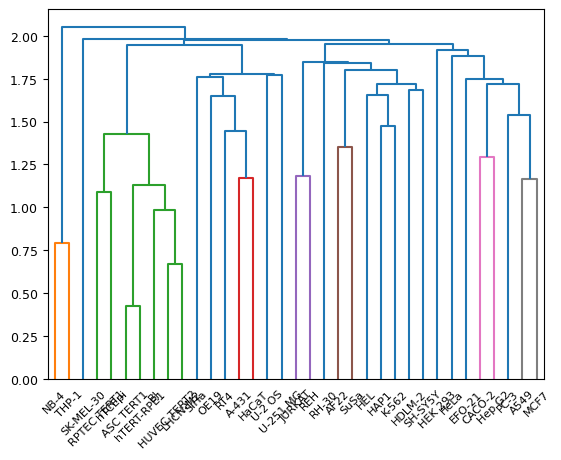

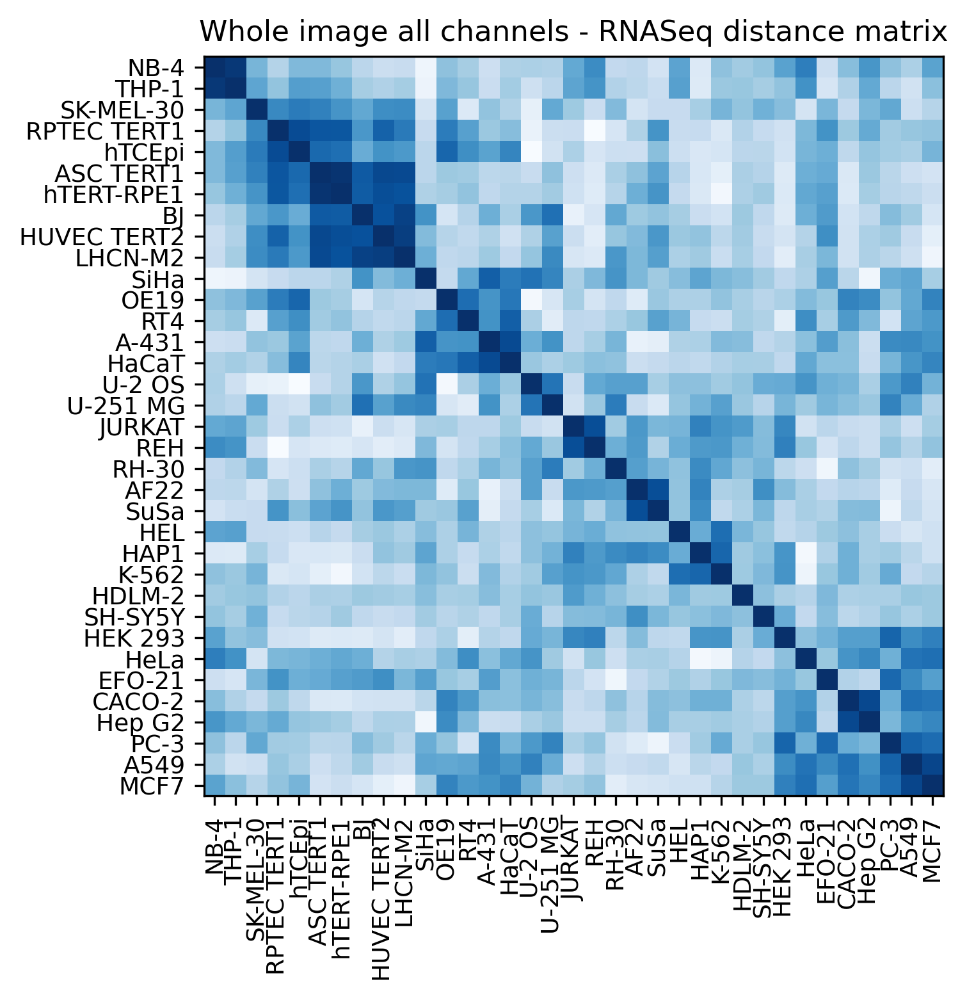

<Figure size 640x480 with 0 Axes>

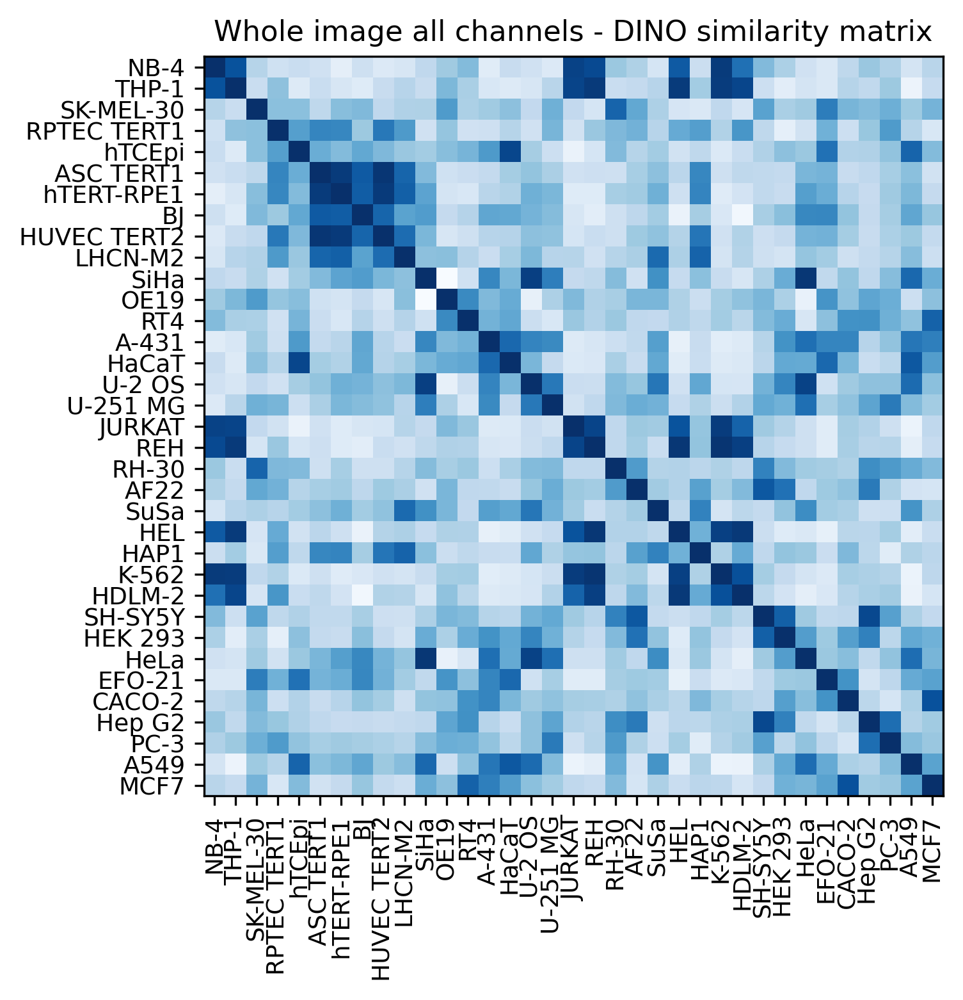

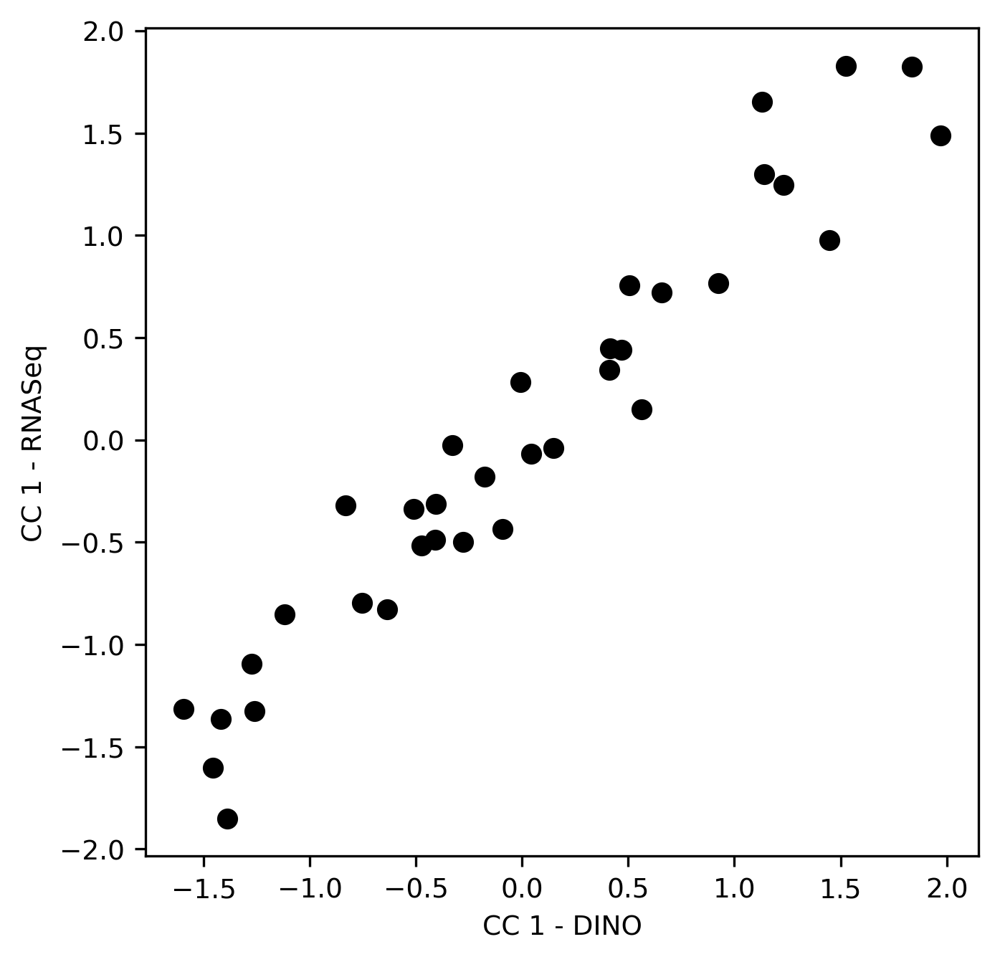

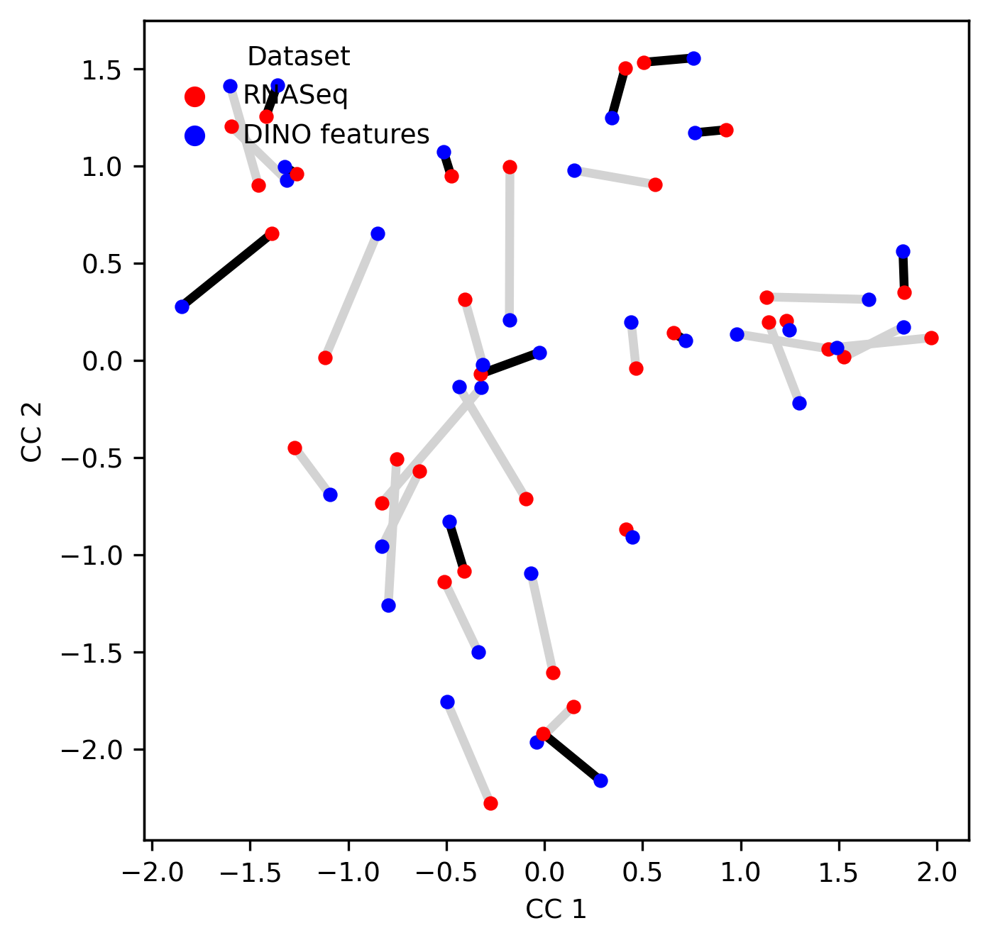

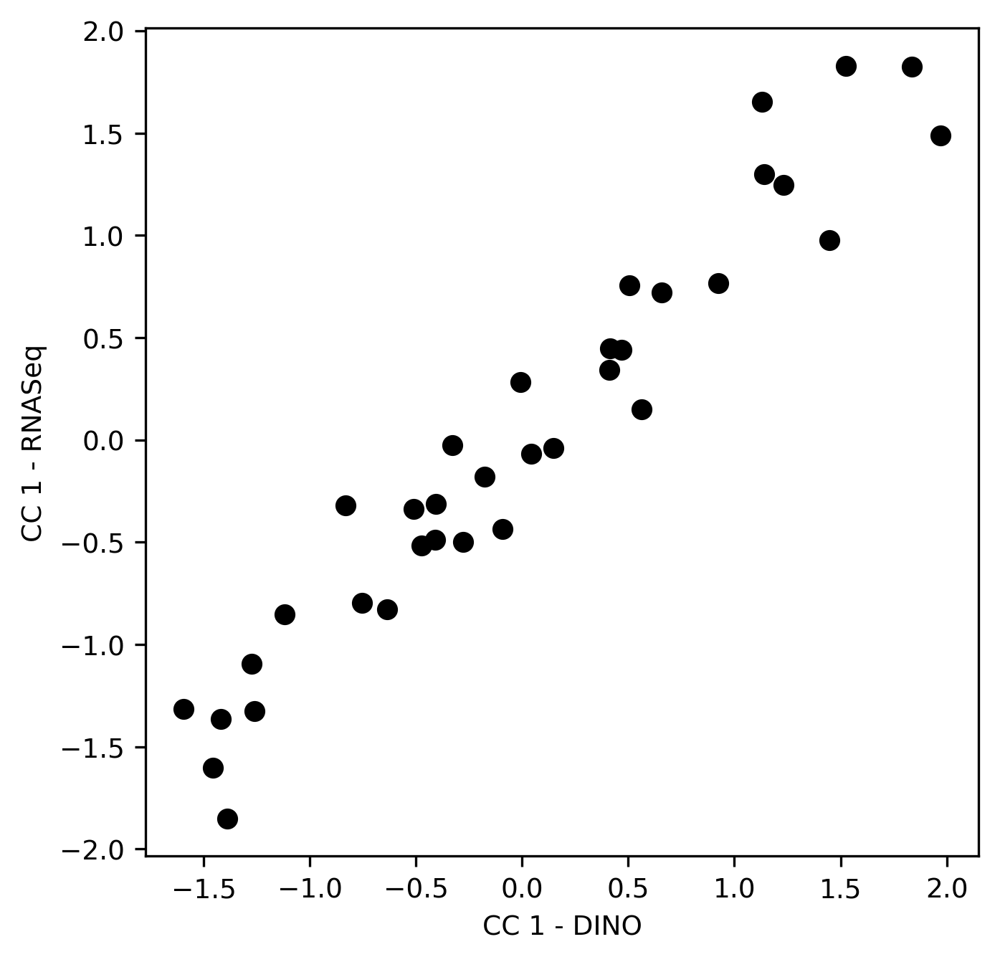

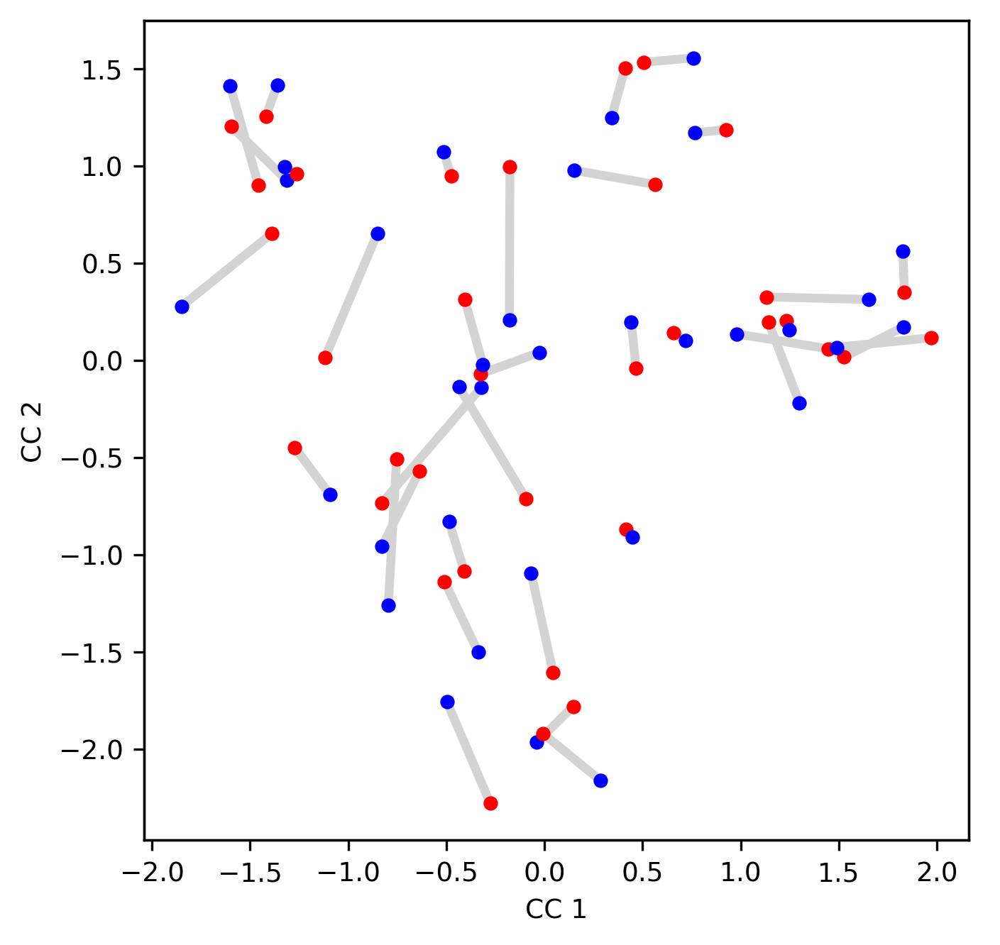

...

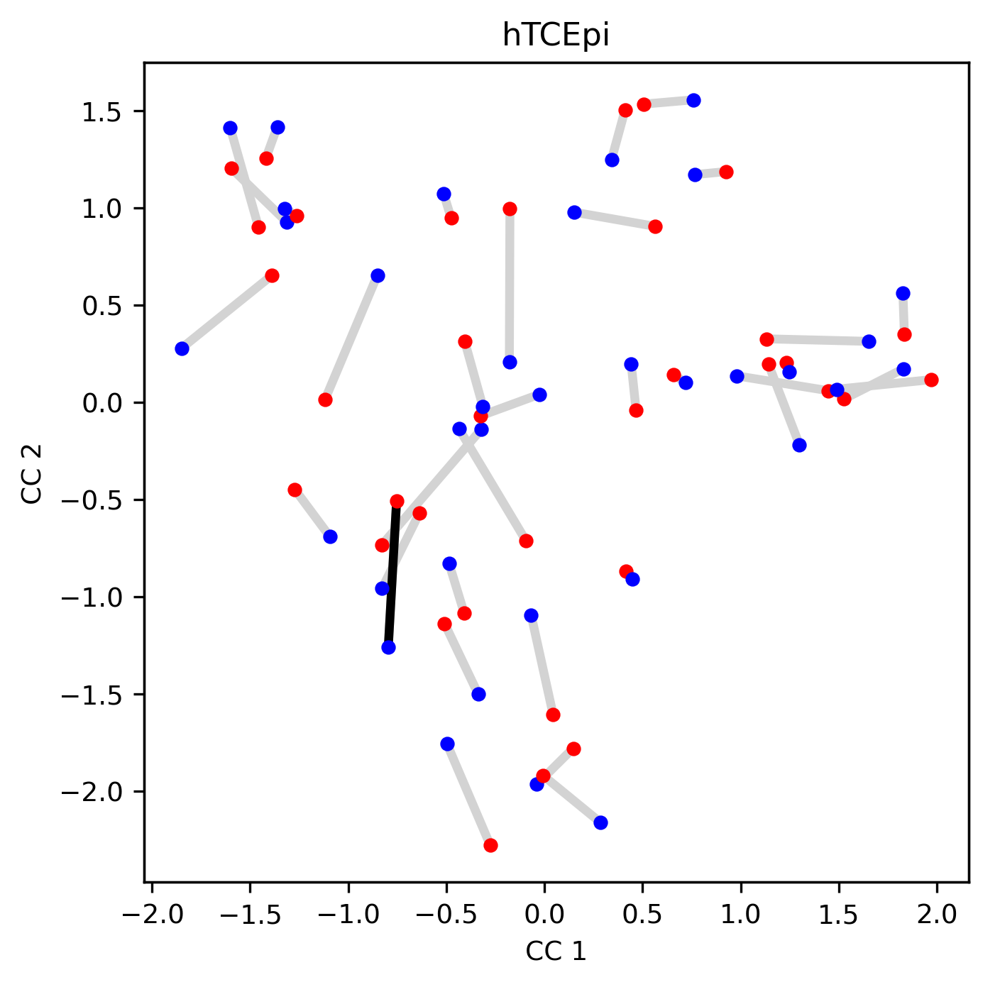

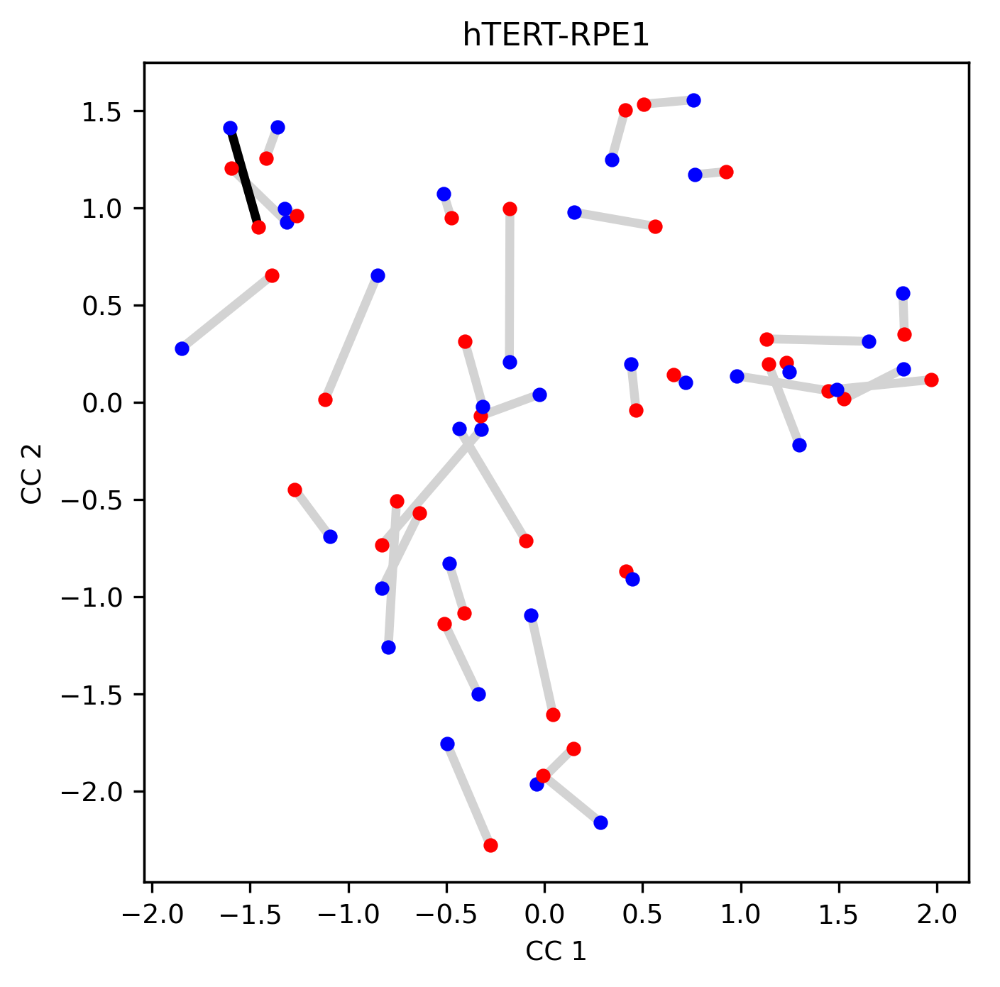

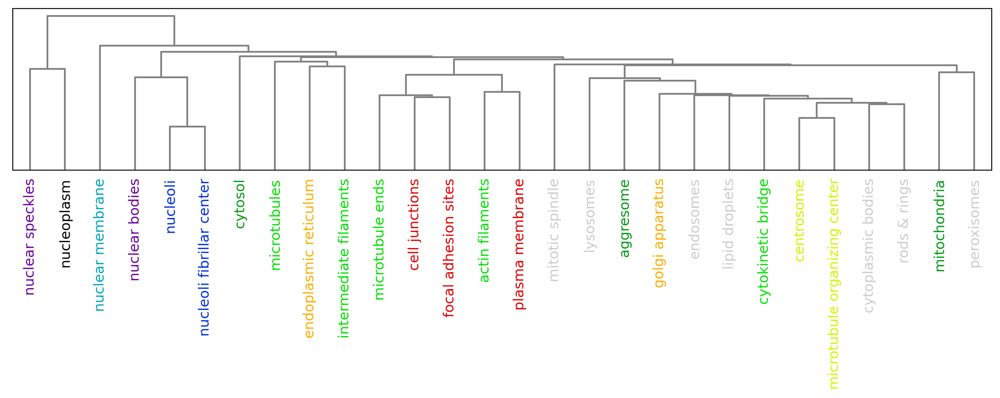

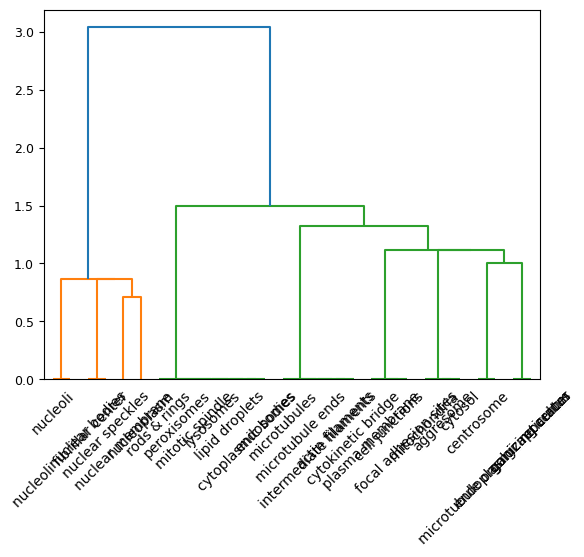

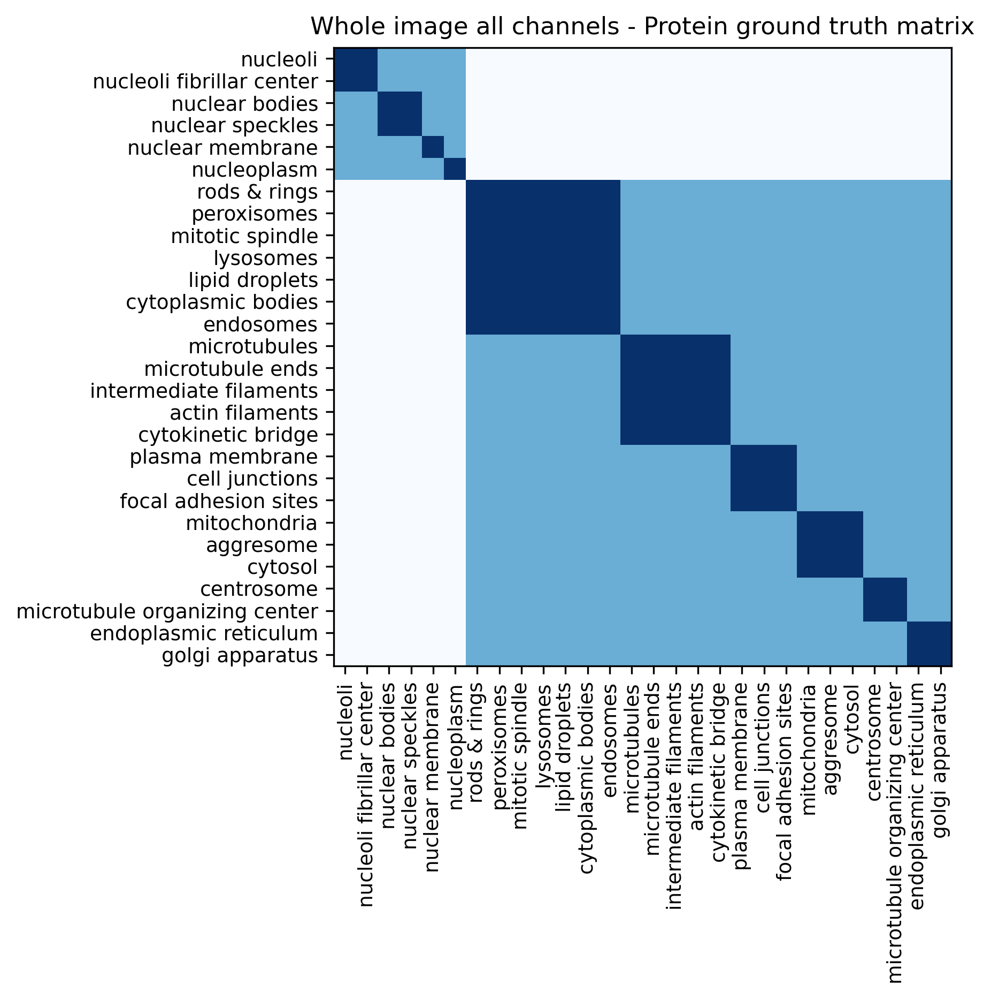

<Figure size 640x480 with 0 Axes>

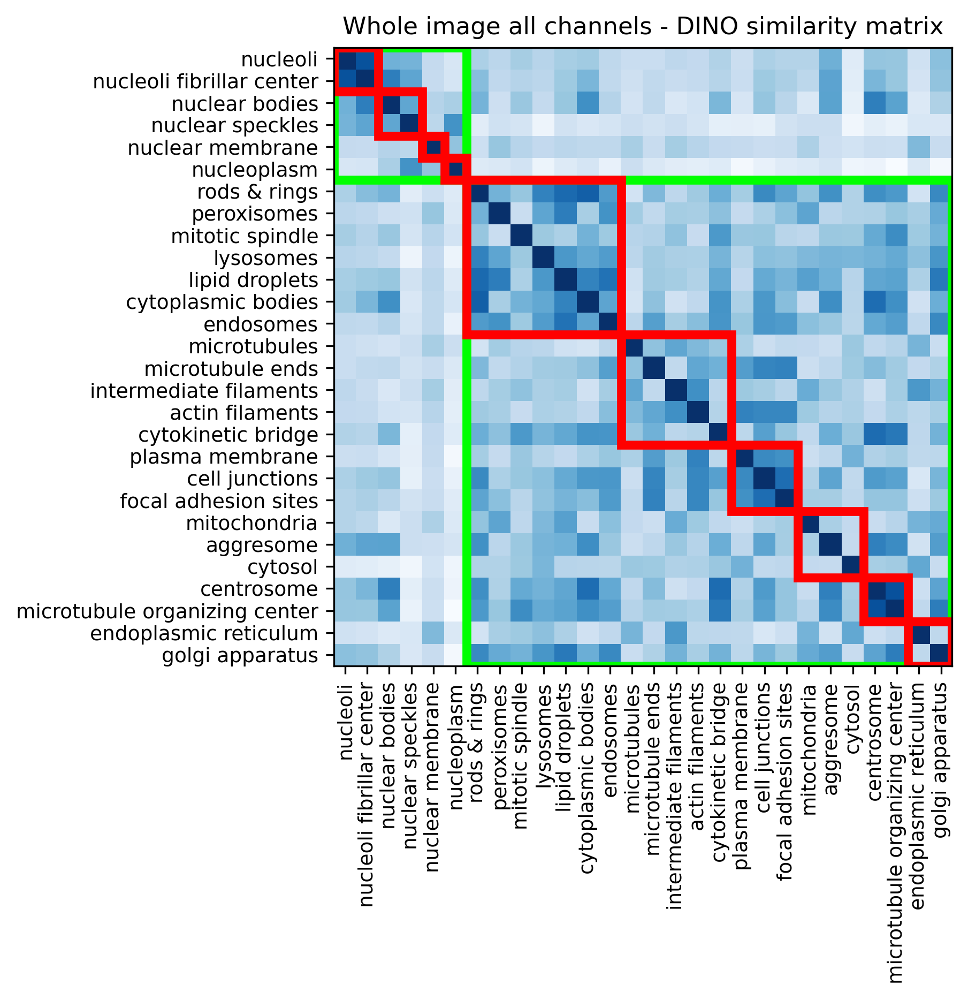

In [41]:
config_files = [
    '/scr/mdoron/Dino4Cells/configs/config_FAIR_whole_image_all_channels.yaml',
               ]
labels = [
    'Whole image all channels',
             ]

label_types = [
    'whole_image',
              ]

feature_types = [
    'full',
              ]

results = []
for config_file, label, label_type, feature_type in zip(config_files, labels, label_types, feature_types):
    print(f'Now analysing {label}')
#     protein_mantel_test = create_protein_hierarchy(config_file, label_type=label_type, apply_pca=True, label=label, feature_type=feature_type)
    rnaseq_mantel_test, top_1_accuracy = create_cell_comparison(config_file, apply_pca=True, label=label, feature_type=feature_type)
    protein_mantel_test = create_protein_hierarchy(config_file, label_type=label_type, apply_pca=False, label=label, feature_type=feature_type)
#     rnaseq_mantel_test, top_1_accuracy = create_cell_comparison(config_file, apply_pca=False, label=label, feature_type=feature_type)
    

Text(0.5, 0, 'MAP')

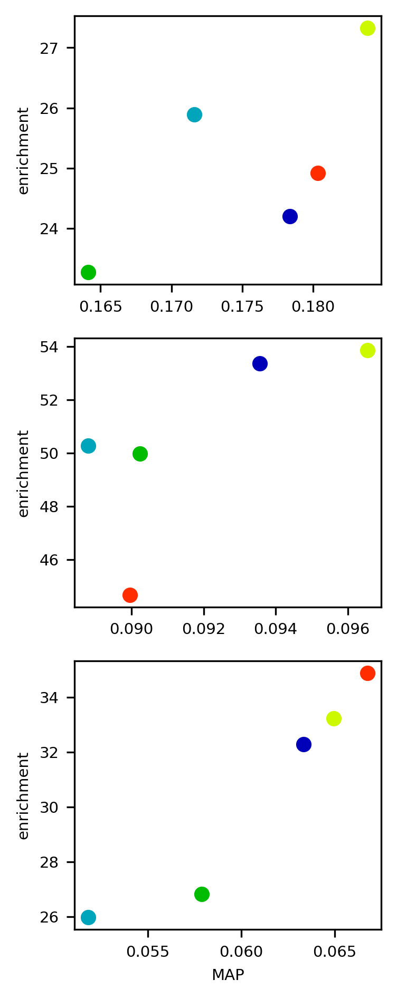

In [41]:


TAORF_ViT_Base_300_enrichment = 24.2
TAORF_ViT_Base_300_MAP = 0.1783741585
TAORF_CellProfiler_enrichment = 25.89
TAORF_CellProfiler_MAP = 0.1715952782
TAORF_ImageNet_enrichment = 23.27
TAORF_ImageNet_MAP = 0.164134703
TAORF_CNN_enrichment = 27.33
TAORF_CNN_MAP = 0.18382
TAORF_enrichment = 24.92
TAORF_MAP = 0.18033

BBBC022_ViT_Base_300_enrichment = 53.37
BBBC022_ViT_Base_300_MAP = 0.09356398887
BBBC022_CellProfiler_enrichment = 50.27
BBBC022_CellProfiler_MAP = 0.088801
BBBC022_ImageNet_enrichment = 49.97
BBBC022_ImageNet_MAP = 0.09023
BBBC022_CNN_enrichment = 53.85
BBBC022_CNN_MAP = 0.096541
BBBC022_enrichment = 44.68
BBBC022_MAP = 0.08996

CDRP_ViT_Base_300_enrichment = 32.29
CDRP_ViT_Base_300_MAP = 0.06333469423
CDRP_CellProfiler_enrichment = 25.98
CDRP_CellProfiler_MAP = 0.051813
CDRP_ImageNet_enrichment = 26.83
CDRP_ImageNet_MAP = 0.057885
CDRP_CNN_enrichment = 33.22
CDRP_CNN_MAP = 0.064951
CDRP_enrichment = 34.88
CDRP_MAP = 0.066742


fig, axes = plt.subplots(3, 1, figsize=(2.5,2.5 * 3), dpi=300)
axes[0].scatter(TAORF_ViT_Base_300_MAP, 
                TAORF_ViT_Base_300_enrichment, label='DINO', color=cmap(1 / 6))
axes[0].scatter(TAORF_CellProfiler_MAP, 
                TAORF_CellProfiler_enrichment, label='CellProfiler', color=cmap(2 / 6))
axes[0].scatter(TAORF_ImageNet_MAP, 
                TAORF_ImageNet_enrichment, label='ImageNet', color=cmap(3 / 6))
axes[0].scatter(TAORF_CNN_MAP, 
                TAORF_CNN_enrichment, label='CNN', color=cmap(4 / 6))
axes[0].scatter(TAORF_MAP, 
                TAORF_enrichment, label='TAORF', color=cmap(5 / 6))
axes[0].set_ylabel('enrichment')
# axes[0].set_xlabel('MAP')
# axes[0].legend(frameon=False)

axes[1].scatter(BBBC022_ViT_Base_300_MAP, 
                BBBC022_ViT_Base_300_enrichment, label='DINO', color=cmap(1 / 6))
axes[1].scatter(BBBC022_CellProfiler_MAP, 
                BBBC022_CellProfiler_enrichment, label='CellProfiler', color=cmap(2 / 6))
axes[1].scatter(BBBC022_ImageNet_MAP, 
                BBBC022_ImageNet_enrichment, label='ImageNet', color=cmap(3 / 6))
axes[1].scatter(BBBC022_CNN_MAP, 
                BBBC022_CNN_enrichment, label='CNN', color=cmap(4 / 6))
axes[1].scatter(BBBC022_MAP, 
                BBBC022_enrichment, label='BBBC022', color=cmap(5 / 6))
axes[1].set_ylabel('enrichment')
# axes[1].set_xlabel('MAP')
# axes[1].legend(frameon=False)

axes[2].scatter(CDRP_ViT_Base_300_MAP, 
                CDRP_ViT_Base_300_enrichment, label='DINO', color=cmap(1 / 6))
axes[2].scatter(CDRP_CellProfiler_MAP, 
                CDRP_CellProfiler_enrichment, label='CellProfiler', color=cmap(2 / 6))
axes[2].scatter(CDRP_ImageNet_MAP, 
                CDRP_ImageNet_enrichment, label='ImageNet', color=cmap(3 / 6))
axes[2].scatter(CDRP_CNN_MAP, 
                CDRP_CNN_enrichment, label='CNN', color=cmap(4 / 6))
axes[2].scatter(CDRP_MAP, 
                CDRP_enrichment, label='CDRP', color=cmap(5 / 6))
axes[2].set_ylabel('enrichment')
axes[2].set_xlabel('MAP')
# axes[2].legend(frameon=False)


0.8750392734061073
Use GPU mode.
	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
	Completed 4 / 10 iteration(s).
	Completed 5 / 10 iteration(s).
	Completed 6 / 10 iteration(s).
	Completed 7 / 10 iteration(s).
	Completed 8 / 10 iteration(s).
	Completed 9 / 10 iteration(s).
	Completed 10 / 10 iteration(s).


/scr/mdoron/miniconda3/lib/python3.9/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/tmp/ipykernel_315713/3976525849.py:49: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(2.5, 2.5), dpi=300)


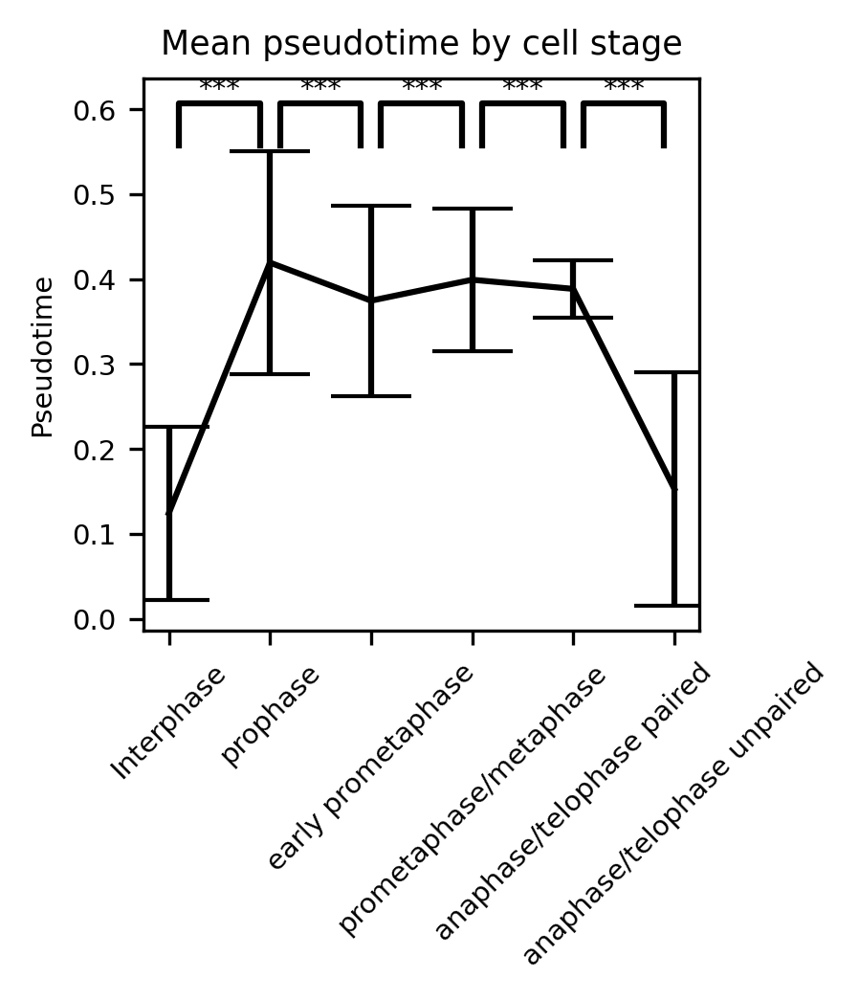

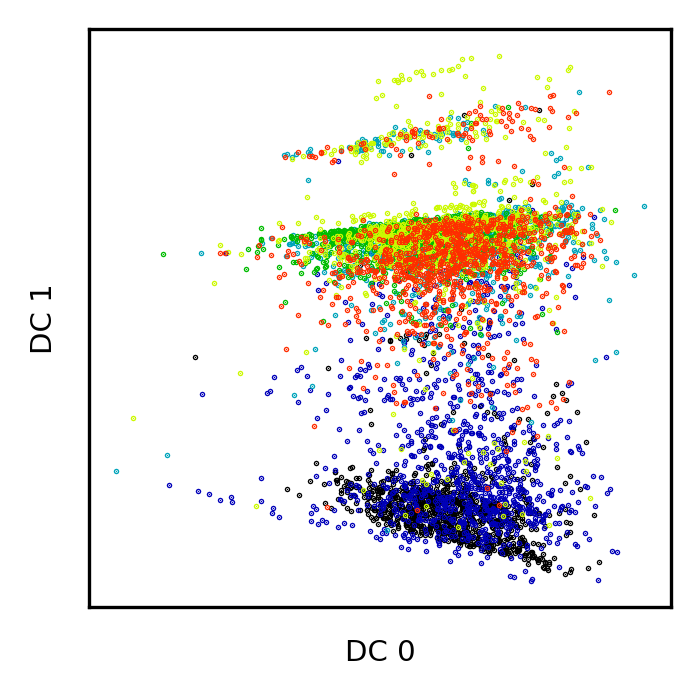

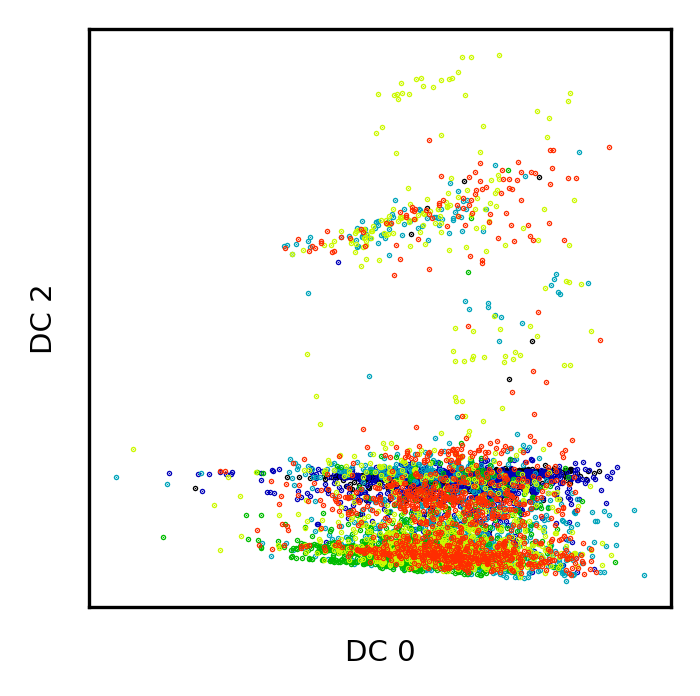

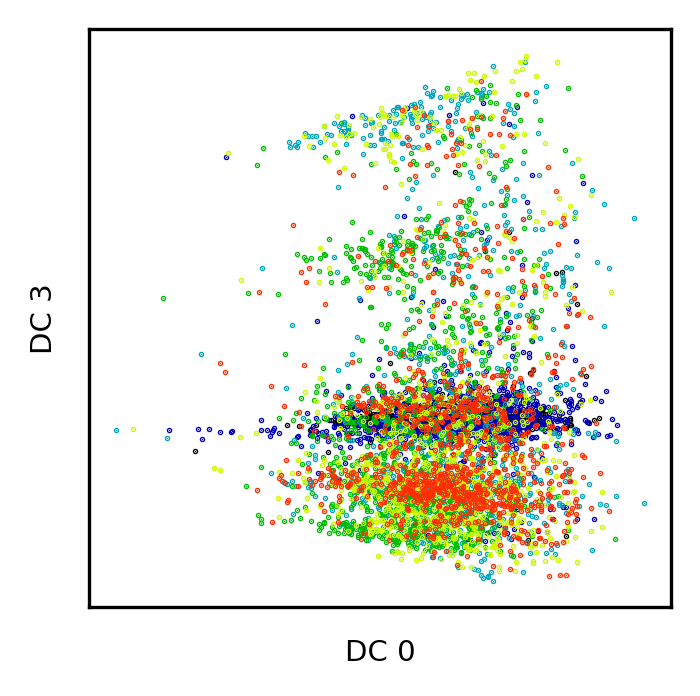

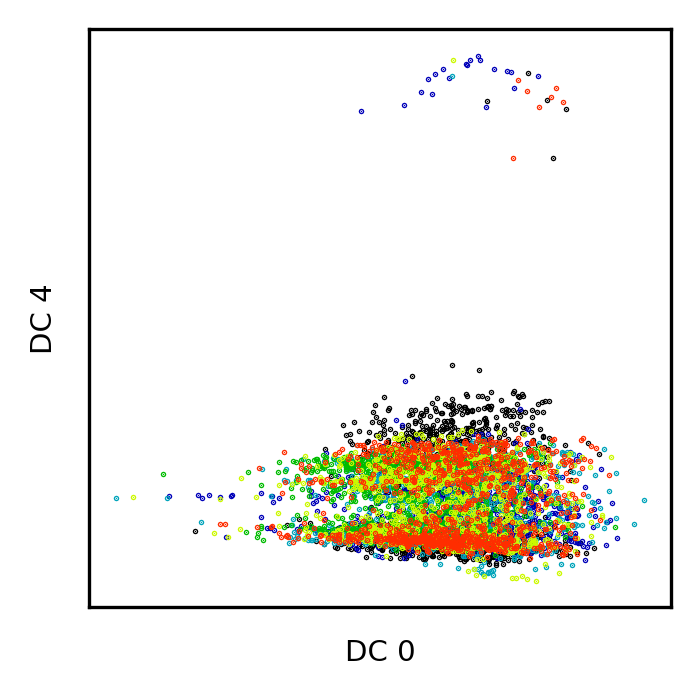

...

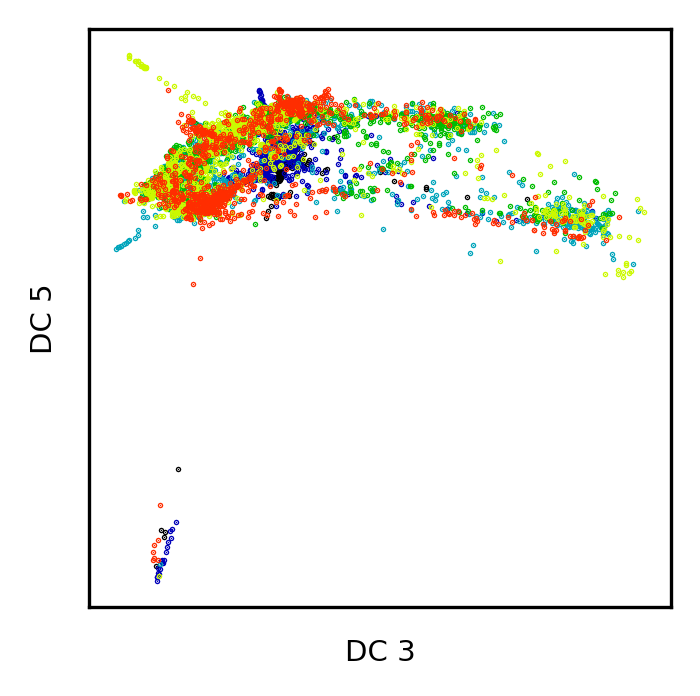

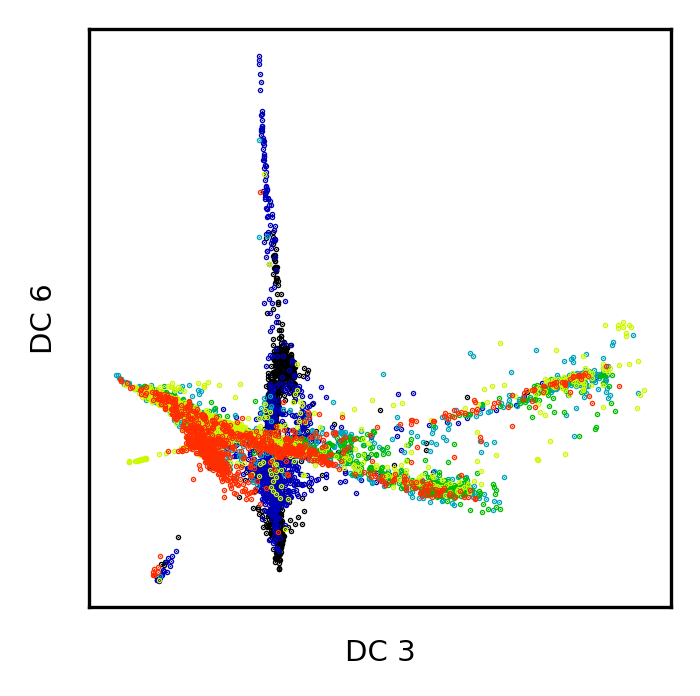

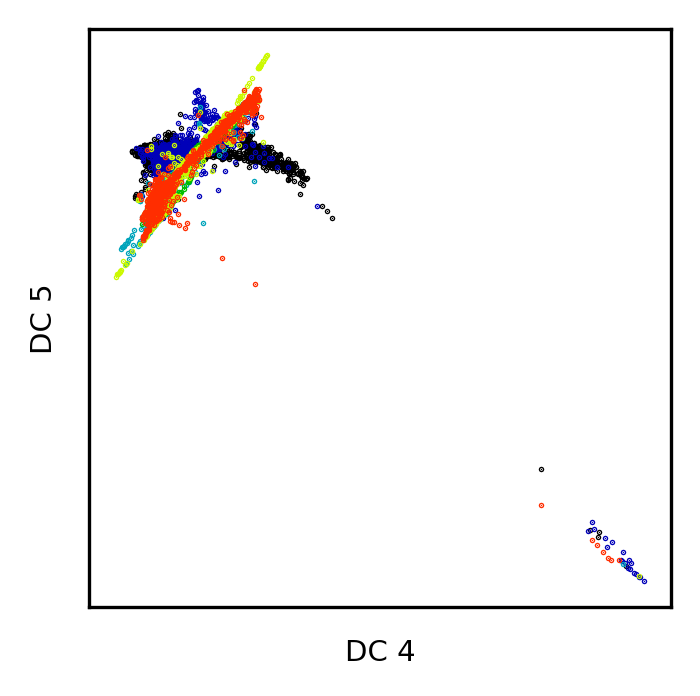

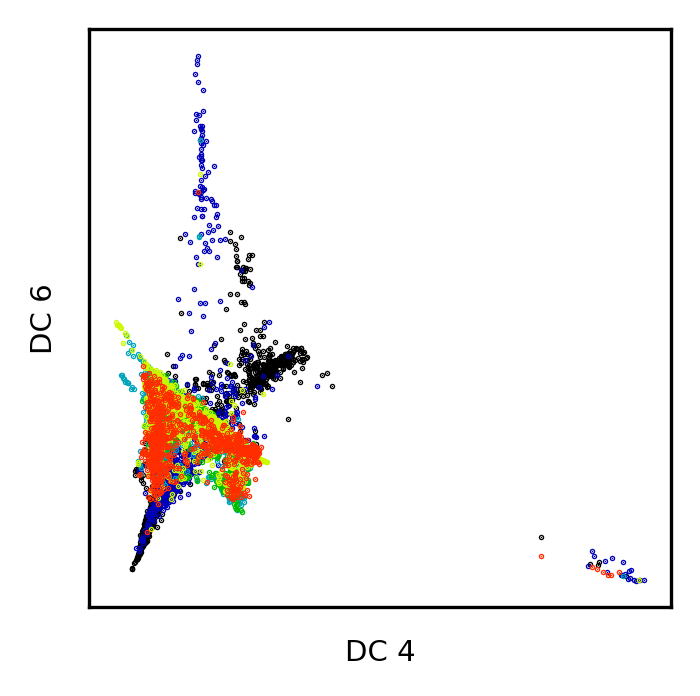

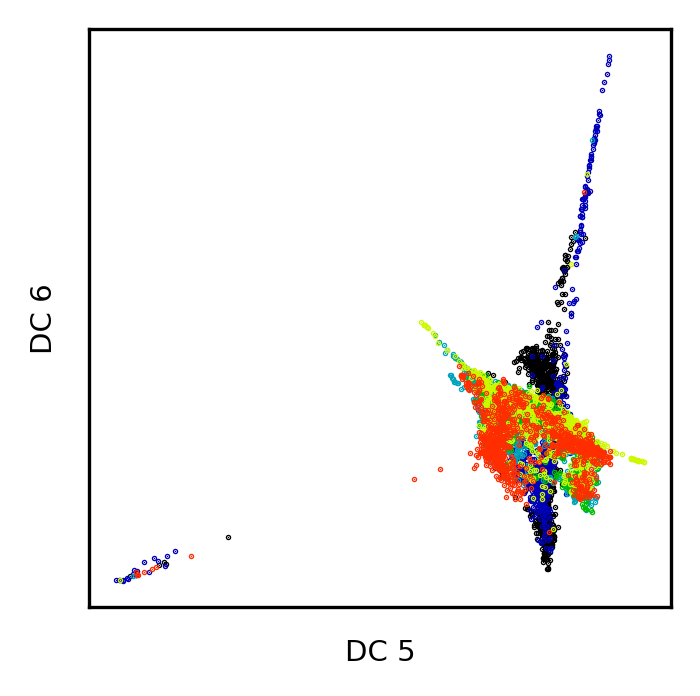

In [51]:
f = torch.load('/scr/mdoron/allen/cytodata-hackathon-base/results_3_channels//normalized_features.pth')[0]
df = pd.read_csv('/scr/mdoron/allen/cytodata-hackathon-base/normalized_cell_df.csv')
f[np.unique(np.where(np.isnan(f.numpy()))[0])] = 0   
sorted_df, sorted_trained_features = df, f
n_components = 50
samples_per_cell_stage = 1000
sorted_df['cell_stage'] = sorted_df['cell_stage'].map(dict(zip(sorted(sorted_df['cell_stage'].unique()), phases)))

cell_stage_groups = sorted_df.reset_index().groupby(['cell_stage']).groups
balanced_indices = np.concatenate([(cell_stage_groups[key][:samples_per_cell_stage]) for key in cell_stage_groups])
reduced_features = get_reduced_features(sorted_trained_features[balanced_indices], n_components=n_components)
sorted_df =  sorted_df.iloc[balanced_indices].reset_index()
harmonized_features = get_harmonized_features(reduced_features, sorted_df, ['Structure'])

features_to_analyse = torch.Tensor(harmonized_features).numpy()
adata = sc.AnnData(features_to_analyse, obs=sorted_df[['CellId','Structure','cell_stage']], 
                   var=[f'feature_{i}' for i in range(features_to_analyse.shape[1])])
adata.uns['iroot'] = np.flatnonzero(adata.obs['cell_stage'] == 'Interphase')[0]
neighbors = sc.pp.neighbors(adata, use_rep='X')
sc.tl.diffmap(adata, n_comps=10)
neighbors = sc.pp.neighbors(adata, use_rep='X', copy=True)
sc.tl.dpt(adata)
pseudo_time = adata.obs['dpt_pseudotime'].values

transition_matrix = neighbors.obsp['connectivities']
eig_val, eig_vec = eigs(transition_matrix, k=10)

cell_stage_groups = sorted_df.reset_index().groupby(['cell_stage']).groups
pseudo_time_divided_by_cell_stages = [(pseudo_time)[cell_stage_groups[k]] for k in sorted(cell_stage_groups.keys())]
no_inf_pseudo_time = np.where(pseudo_time == np.inf, np.nan, pseudo_time)
mean_pseudotime = [np.nanmean(no_inf_pseudo_time[cell_stage_groups[k]]) for k in sorted(cell_stage_groups.keys())]
std_pseudotime = [np.nanstd(no_inf_pseudo_time[cell_stage_groups[k]]) for k in sorted(cell_stage_groups.keys())]

fig, ax = plt.subplots(figsize=(2.5,2.5), dpi=300)
plt.errorbar(x = range(6), y = mean_pseudotime, yerr=std_pseudotime, capsize=10, color='black')
plt.xticks(range(6), phases, rotation=45)
plt.ylabel('Pseudotime')
plt.title('Mean pseudotime by cell stage')
for x1 in range(5):
    x2 = x1 + 1
    pvalue = (ttest_ind(pseudo_time_divided_by_cell_stages[x1], pseudo_time_divided_by_cell_stages[x2])[1] * 5)
    pvalue = '***' if pvalue < 0.001 else 'ns'
    y, h, col = max(mean_pseudotime) + max(std_pseudotime), 0.05, 'k'
    plt.plot([x1 + 0.1, x1 + 0.1, x2 - 0.1, x2 - 0.1], [y, y+h, y+h, y], lw=1.5, c=col)
    plt.text((x1+x2)*.5, y+h, pvalue, ha='center', va='bottom', color=col)
cell_stage_groups = sorted_df.groupby('cell_stage').groups
for i in range(7):
    for j in range(i + 1, 7):
        plt.figure(figsize=(2.5, 2.5), dpi=300)
        for ind, key in enumerate(phases):
            indices = cell_stage_groups[key]
            plt.scatter(adata.obsm['X_diffmap'][indices,i],
                        adata.obsm['X_diffmap'][indices,j], 
                        s=0.1,
                        color=cmap(ind / len(phases)))
            plt.xlabel(f'DC {i}')
            plt.ylabel(f'DC {j}')
            plt.xticks([])
            plt.yticks([])


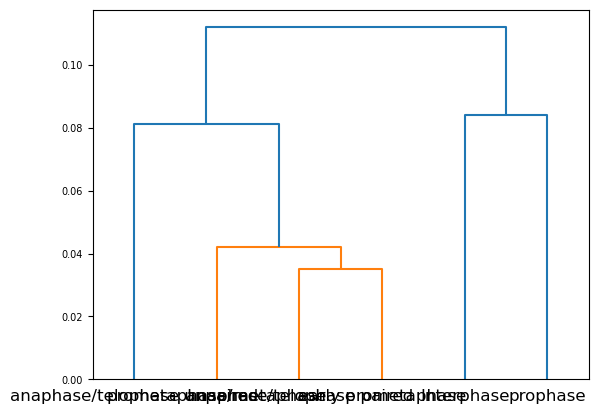

<Figure size 640x480 with 0 Axes>

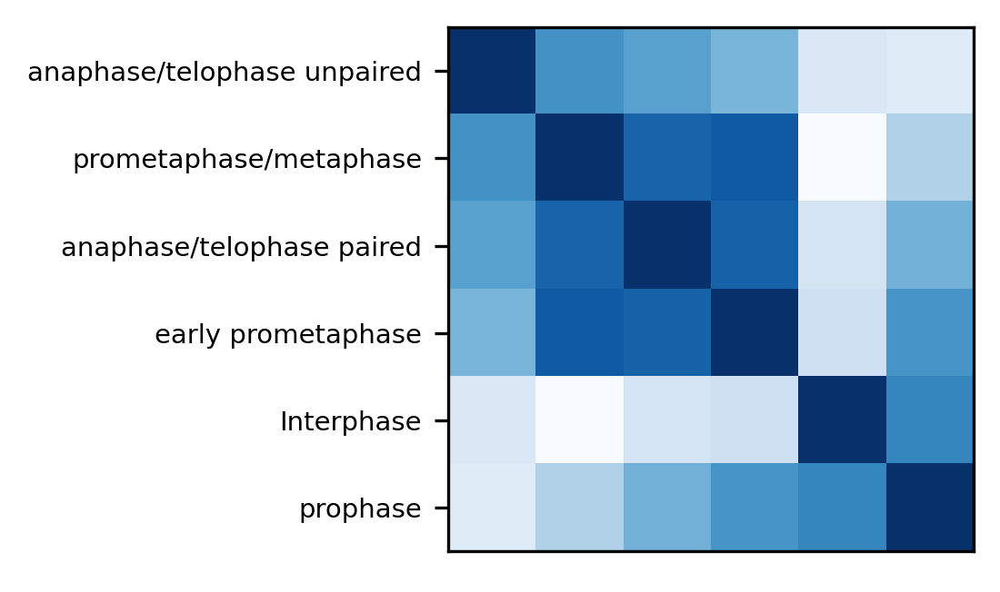

In [75]:
f = torch.load('/scr/mdoron/allen/cytodata-hackathon-base/results/pretrained_combined.pth')[0]
# f = torch.load('/scr/mdoron/allen/cytodata-hackathon-base/results_3_channels//normalized_features.pth')[0]
df = pd.read_csv('/scr/mdoron/allen/cytodata-hackathon-base/normalized_cell_df.csv')
f[np.unique(np.where(np.isnan(f.numpy()))[0])] = 0   
sorted_df, sorted_trained_features = df, f
n_components = 50
samples_per_cell_stage = 1000
sorted_df['cell_stage'] = sorted_df['cell_stage'].map(dict(zip(sorted(sorted_df['cell_stage'].unique()), phases)))

cell_stage_groups = sorted_df.reset_index().groupby(['cell_stage']).groups
balanced_indices = np.concatenate([(cell_stage_groups[key][:samples_per_cell_stage]) for key in cell_stage_groups])
# reduced_features = get_reduced_features(sorted_trained_features[balanced_indices], n_components=n_components)
reduced_features = sorted_trained_features[balanced_indices]
sorted_df =  sorted_df.iloc[balanced_indices].reset_index()

scaled_averaged_features, cell_columns = get_averaged_features(sorted_df, torch.Tensor(reduced_features), ['cell_stage'], sort=True)

reduced_averaged_features = 1 - squareform(pdist(scaled_averaged_features, metric='cosine'))
plt.figure()
ground_truth_Z = linkage(reduced_averaged_features)
dn = dendrogram(ground_truth_Z, labels = cell_columns)
reduced_averaged_features = reduced_averaged_features[dn['leaves'], :][:, dn['leaves']]

cell_columns = dn['ivl']
plt.figure()
plt.figure(figsize=(2.5,2.5), dpi=300)
plt.imshow(reduced_averaged_features, cmap='Blues')
plt.xticks([])
plt.yticks(range(len(cell_columns)), cell_columns)
print('')


In [ ]:
f = torch.load('/scr/mdoron/allen/cytodata-hackathon-base/results/pretrained_combined.pth')[0]
# f = torch.load('/scr/mdoron/allen/cytodata-hackathon-base/results_3_channels//normalized_features.pth')[0]
df = pd.read_csv('/scr/mdoron/allen/cytodata-hackathon-base/normalized_cell_df.csv')
f[np.unique(np.where(np.isnan(f.numpy()))[0])] = 0   
sorted_df, sorted_trained_features = df, f
n_components = 50
samples_per_cell_stage = 1000
sorted_df['cell_stage'] = sorted_df['cell_stage'].map(dict(zip(sorted(sorted_df['cell_stage'].unique()), phases)))

cell_stage_groups = sorted_df.reset_index().groupby(['cell_stage']).groups
balanced_indices = np.concatenate([(cell_stage_groups[key][:samples_per_cell_stage]) for key in cell_stage_groups])
# reduced_features = get_reduced_features(sorted_trained_features[balanced_indices], n_components=n_components)
reduced_features = sorted_trained_features[balanced_indices]
sorted_df =  sorted_df.iloc[balanced_indices].reset_index()

scaled_averaged_features, cell_columns = get_averaged_features(sorted_df, torch.Tensor(reduced_features), ['cell_stage'], sort=True)

reduced_averaged_features = 1 - squareform(pdist(scaled_averaged_features, metric='cosine'))
plt.figure()
ground_truth_Z = linkage(reduced_averaged_features)
dn = dendrogram(ground_truth_Z, labels = cell_columns)
reduced_averaged_features = reduced_averaged_features[dn['leaves'], :][:, dn['leaves']]

cell_columns = dn['ivl']
plt.figure()
plt.figure(figsize=(2.5,2.5), dpi=300)
plt.imshow(reduced_averaged_features, cmap='Blues')
plt.xticks([])
plt.yticks(range(len(cell_columns)), cell_columns)
print('')


In [229]:
df_LINCS

,X,Y,index,Plate,Well,Treatment,Treatment_Clean,moa,0,1,...,375,376,377,378,379,380,381,382,383,highlight_moa
0,7.995335,1.658559,0,SQ00014812,A01,DMSO@NA,DMSO@NA,Control,-2.567512,-1.513013,...,2.405791,-1.889109,-1.576723,-0.157903,0.202376,0.010933,1.206989,1.149409,-0.417359,Control
1,8.239088,-0.512374,1,SQ00014812,A02,DMSO@NA,DMSO@NA,Control,-1.084211,-0.035586,...,1.169898,-0.034630,-1.227446,0.344411,0.872320,1.548765,0.477538,0.264484,0.603760,Control
2,8.292418,-0.680029,2,SQ00014812,A03,DMSO@NA,DMSO@NA,Control,-0.894325,0.151078,...,-0.750329,0.860044,0.088225,0.710794,1.836713,2.003794,0.363119,0.970850,1.257497,Control
3,8.247620,-0.624955,3,SQ00014812,A04,DMSO@NA,DMSO@NA,Control,0.899258,-0.451614,...,0.492619,1.861191,-0.958616,-1.269069,0.338846,2.255480,1.189040,0.620562,0.121267,Control
4,8.334196,-0.703079,4,SQ00014812,A05,DMSO@NA,DMSO@NA,Control,-1.170170,0.979243,...,-0.038693,0.654901,1.280437,-0.897054,0.798899,2.535730,0.445024,0.772731,-0.455288,Control
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9263,5.453664,2.196696,10902,SQ00015233,O13,BRD-K41160163-001-06-8@9.99999999999999999,BRD-K41160163,glutamate receptor antagonist,2.598795,0.267901,...,0.057668,1.155497,-0.825858,1.523291,1.598962,0.541175,1.262571,-0.907260,0.517281,Other
9264,7.560327,0.573045,10903,SQ00015233,P01,BRD-K41170226-001-13-8@9.99999999999999999,BRD-K41170226,biliverdin reductase A activator|G protein-cou...,1.890201,0.858699,...,-0.719463,2.375745,2.843986,-1.053385,3.084567,-1.430164,-2.095763,2.733498,-1.226904,Other
9265,5.663999,2.059325,10904,SQ00015233,P07,BRD-K40870905-001-01-7@9.99999999999999999,BRD-K40870905,integrin antagonist,2.103213,-1.691682,...,-0.555355,0.173693,-1.553082,-1.107143,0.661413,3.185741,0.519325,-0.752479,-0.265033,Other
9266,7.783052,3.682214,10905,SQ00015233,P13,BRD-K41599323-001-02-3@9.99999999999999999,BRD-K41599323,farnesyltransferase inhibitor,2.731071,0.318112,...,1.502996,3.173039,-2.325357,2.471730,2.696250,1.708928,1.679439,0.783671,0.516468,Other


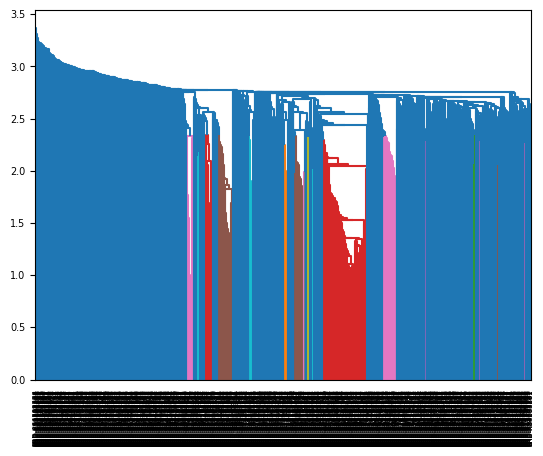

<Figure size 640x480 with 0 Axes>

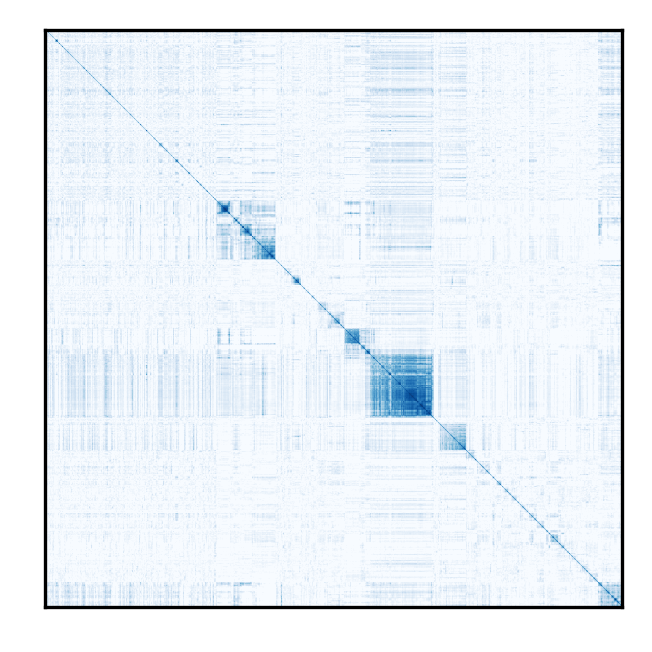

In [5]:
df_LINCS = pd.read_csv('/scr/mdoron/Dino4Cells/UMAP_of_LINCS_ViT_Small_Compressed.csv')
features = df_LINCS[[f'{i}' for i in range(384)]].values

scaled_averaged_features, cell_columns = get_averaged_features(df_LINCS, torch.Tensor(features), ['Treatment_Clean'], sort=False)
reduced_averaged_features = 1 - squareform(pdist(scaled_averaged_features, metric='cosine'))

plt.figure()
ground_truth_Z = linkage(reduced_averaged_features, method='single')
dn = dendrogram(ground_truth_Z, labels = cell_columns)
reduced_averaged_features = reduced_averaged_features[dn['leaves'], :][:, dn['leaves']]
cell_columns = dn['ivl']

plt.figure()
plt.figure(figsize=(2.5,2.5), dpi=300)
plt.imshow(reduced_averaged_features, cmap='Blues', vmin=0, vmax=1)
plt.xticks([])
plt.yticks([])
print('')


<Figure size 640x480 with 0 Axes>

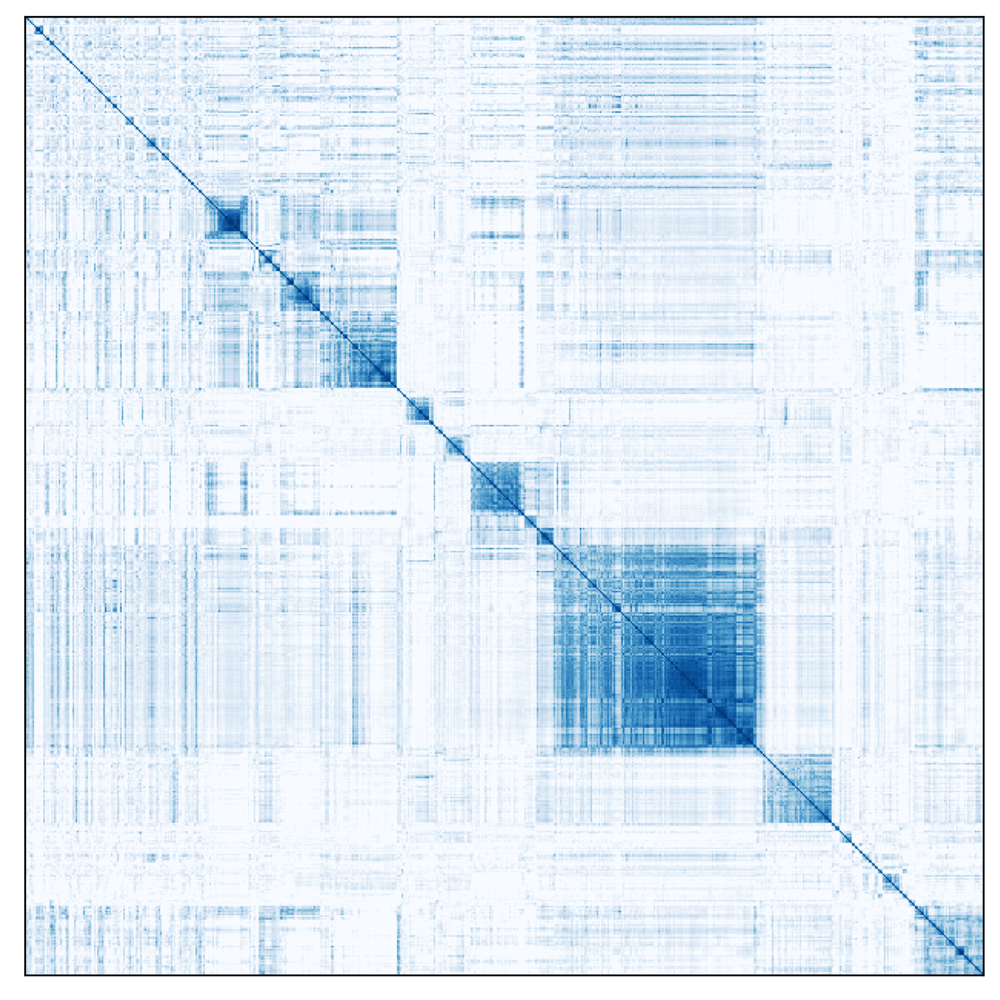

In [6]:
no_diag_reduced_averaged_features = np.copy(reduced_averaged_features)
for i in range(no_diag_reduced_averaged_features.shape[0]):
    no_diag_reduced_averaged_features[i,i] = 0
indices = sorted(np.argsort(no_diag_reduced_averaged_features.max(axis=0))[-int(len(no_diag_reduced_averaged_features.max(axis=0)) / 2) :])

plt.figure()
plt.figure(figsize=(7.5,7.5), dpi=300)
plt.imshow(reduced_averaged_features[:,indices][indices,:], cmap='Blues', vmin=0, vmax=1)
plt.xticks([])
plt.yticks([])
print('')


In [7]:
names, counts = np.unique([df_LINCS[df_LINCS.Treatment_Clean == c].moa.iloc[0] for c in np.array(cell_columns)[indices]], return_counts=True)
names[np.argmax(counts)]

'EGFR inhibitor'

In [8]:
len([df_LINCS[df_LINCS.Treatment_Clean == c].moa.iloc[0] for c in np.array(cell_columns)[indices]])

624

7

['PI3K inhibitor', 'tubulin polymerization inhibitor', 'microtubule stabilizing agent', 'tubulin polymerization inhibitor', 'microtubule inhibitor|tubulin polymerization inhibitor', 'tubulin polymerization inhibitor', 'tyrosine kinase inhibitor', 'tumor necrosis factor release inhibitor', 'PLK inhibitor', 'tubulin polymerization inhibitor', 'microtubule inhibitor', 'SRC inhibitor|tubulin polymerization inhibitor', 'tubulin polymerization inhibitor', 'tubulin polymerization inhibitor']

['topoisomerase inhibitor', 'Aurora kinase inhibitor|JAK inhibitor', 'CDK inhibitor', 'CDK inhibitor', 'FGFR antagonist', 'CDK inhibitor', 'CDK inhibitor', 'CDK inhibitor', 'focal adhesion kinase inhibitor', 'p21 activated kinase inhibitor', 'focal adhesion kinase inhibitor', 'HSP inhibitor', 'HSP inhibitor', 'HSP inhibitor', 'HSP inhibitor', 'HSP inhibitor']

['protein synthesis inhibitor', 'protein synthesis inhibitor', 'oxidative stress inducer', 'NFkB pathway inhibitor|proteasome inhibitor', 'DNA 

/scr/mdoron/miniconda3/lib/python3.9/site-packages/IPython/core/events.py:89: UserWarning: Glyph 128 (\x80) missing from current font.
  func(*args, **kwargs)
/scr/mdoron/miniconda3/lib/python3.9/site-packages/IPython/core/events.py:89: UserWarning: Glyph 147 (\x93) missing from current font.
  func(*args, **kwargs)


<Figure size 640x480 with 0 Axes>

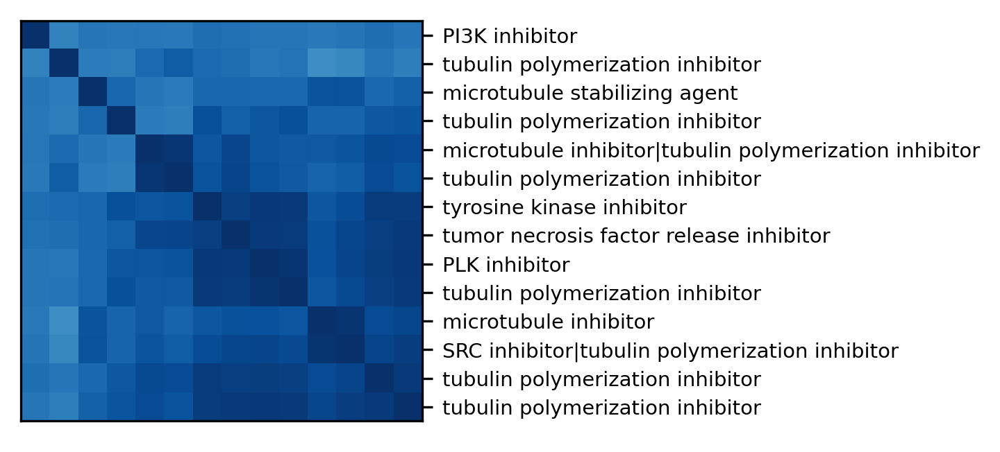

<Figure size 640x480 with 0 Axes>

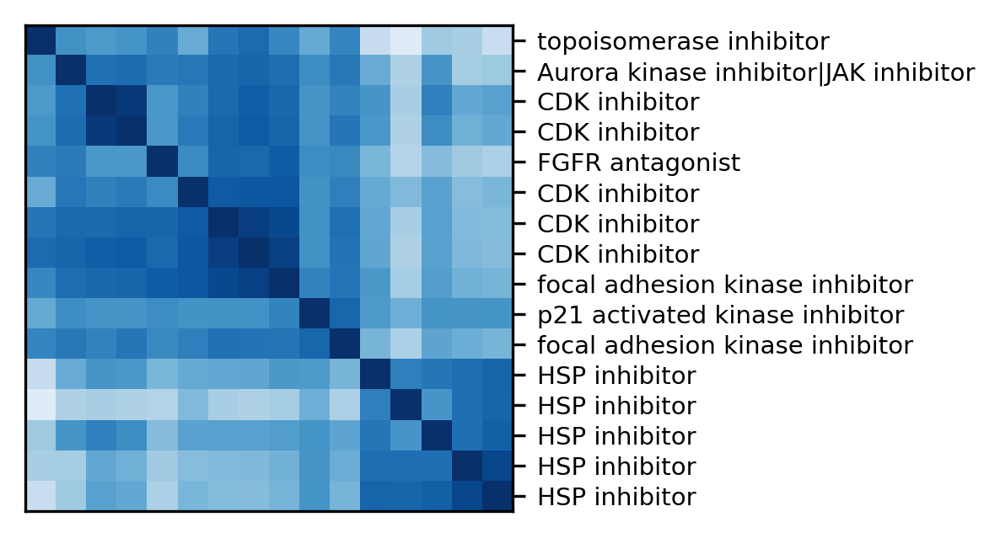

<Figure size 640x480 with 0 Axes>

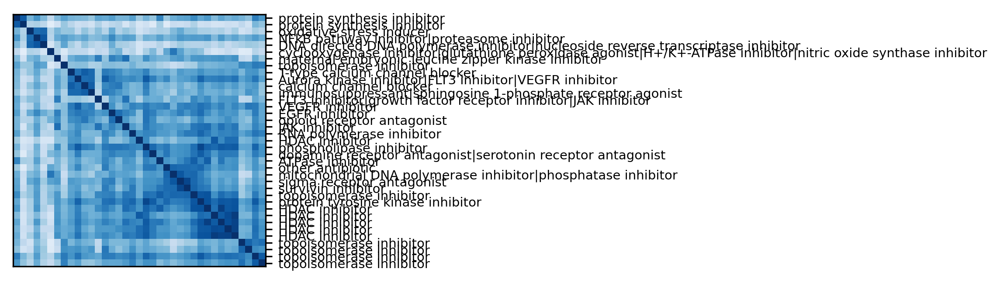

<Figure size 640x480 with 0 Axes>

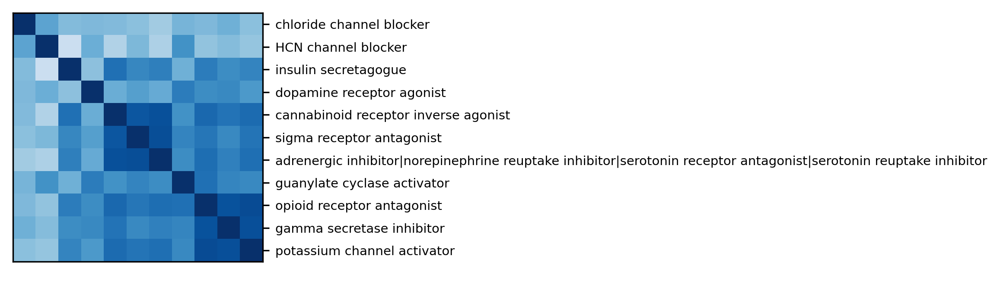

<Figure size 640x480 with 0 Axes>

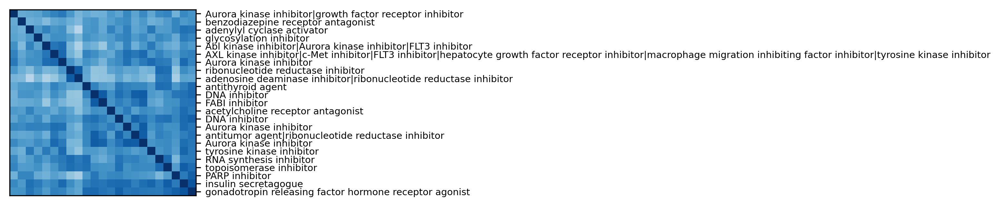

<Figure size 640x480 with 0 Axes>

/scr/mdoron/miniconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 128 (\x80) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/scr/mdoron/miniconda3/lib/python3.9/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 147 (\x93) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


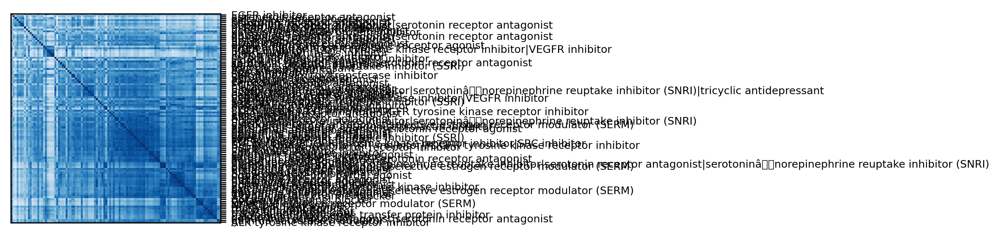

<Figure size 640x480 with 0 Axes>

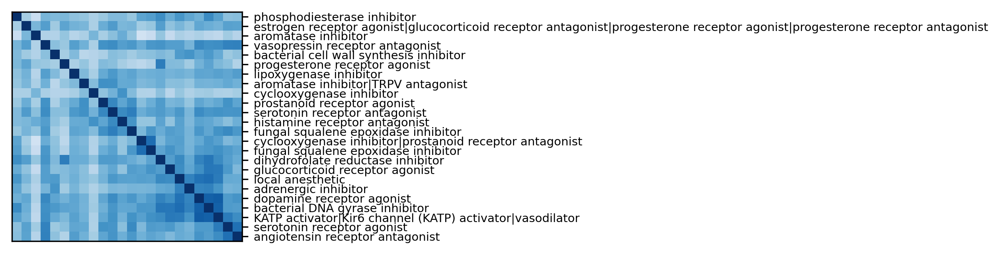

In [9]:
cluster_indices = fcluster(ground_truth_Z, t=2.3, criterion='distance')
cluster_indices = cluster_indices[dn['leaves']]
big_clusters = np.where([len(np.where(cluster_indices == i)[0]) > 10 for i in range(cluster_indices.max())])[0]
print(len(big_clusters))
for cluster_ind in big_clusters:
    indices = np.where(cluster_indices == cluster_ind)[0]
    plt.figure()
    fig, ax = plt.subplots(1,1,figsize=(2.5,2.5), dpi=300)
    plt.imshow(reduced_averaged_features[indices,:][:,indices], cmap='Blues', vmin=0, vmax=1)
    plt.xticks([])
    plt.yticks(range(len(indices)), [df_LINCS[df_LINCS.Treatment_Clean == c].moa.iloc[0] for c in np.array(cell_columns)[indices]])
    ax.yaxis.set_label_position("right")
    ax.yaxis.tick_right()
    
    print('')
    print([df_LINCS[df_LINCS.Treatment_Clean == c].moa.iloc[0] for c in np.array(cell_columns)[indices]])


In [10]:
sorted([df_LINCS[df_LINCS.Treatment_Clean == c].moa.iloc[0] for c in np.array(cell_columns)[indices]])

['KATP activator|Kir6 channel (KATP) activator|vasodilator',
 'adrenergic inhibitor',
 'angiotensin receptor antagonist',
 'aromatase inhibitor',
 'aromatase inhibitor|TRPV antagonist',
 'bacterial DNA gyrase inhibitor',
 'bacterial cell wall synthesis inhibitor',
 'cyclooxygenase inhibitor',
 'cyclooxygenase inhibitor|prostanoid receptor antagonist',
 'dihydrofolate reductase inhibitor',
 'dopamine receptor agonist',
 'estrogen receptor agonist|glucocorticoid receptor antagonist|progesterone receptor agonist|progesterone receptor antagonist',
 'fungal squalene epoxidase inhibitor',
 'fungal squalene epoxidase inhibitor',
 'glucocorticoid receptor agonist',
 'histamine receptor antagonist',
 'lipoxygenase inhibitor',
 'local anesthetic',
 'phosphodiesterase inhibitor',
 'progesterone receptor agonist',
 'prostanoid receptor agonist',
 'serotonin receptor agonist',
 'serotonin receptor antagonist',
 'vasopressin receptor antagonist']

In [11]:
df_LINCS

,X,Y,index,Plate,Well,Treatment,Treatment_Clean,moa,0,1,...,375,376,377,378,379,380,381,382,383,highlight_moa
0,7.995335,1.658559,0,SQ00014812,A01,DMSO@NA,DMSO@NA,Control,-2.567512,-1.513013,...,2.405791,-1.889109,-1.576723,-0.157903,0.202376,0.010933,1.206989,1.149409,-0.417359,Control
1,8.239088,-0.512374,1,SQ00014812,A02,DMSO@NA,DMSO@NA,Control,-1.084211,-0.035586,...,1.169898,-0.034630,-1.227446,0.344411,0.872320,1.548765,0.477538,0.264484,0.603760,Control
2,8.292418,-0.680029,2,SQ00014812,A03,DMSO@NA,DMSO@NA,Control,-0.894325,0.151078,...,-0.750329,0.860044,0.088225,0.710794,1.836713,2.003794,0.363119,0.970850,1.257497,Control
3,8.247620,-0.624955,3,SQ00014812,A04,DMSO@NA,DMSO@NA,Control,0.899258,-0.451614,...,0.492619,1.861191,-0.958616,-1.269069,0.338846,2.255480,1.189040,0.620562,0.121267,Control
4,8.334196,-0.703079,4,SQ00014812,A05,DMSO@NA,DMSO@NA,Control,-1.170170,0.979243,...,-0.038693,0.654901,1.280437,-0.897054,0.798899,2.535730,0.445024,0.772731,-0.455288,Control
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9263,5.453664,2.196696,10902,SQ00015233,O13,BRD-K41160163-001-06-8@9.99999999999999999,BRD-K41160163,glutamate receptor antagonist,2.598795,0.267901,...,0.057668,1.155497,-0.825858,1.523291,1.598962,0.541175,1.262571,-0.907260,0.517281,Other
9264,7.560327,0.573045,10903,SQ00015233,P01,BRD-K41170226-001-13-8@9.99999999999999999,BRD-K41170226,biliverdin reductase A activator|G protein-cou...,1.890201,0.858699,...,-0.719463,2.375745,2.843986,-1.053385,3.084567,-1.430164,-2.095763,2.733498,-1.226904,Other
9265,5.663999,2.059325,10904,SQ00015233,P07,BRD-K40870905-001-01-7@9.99999999999999999,BRD-K40870905,integrin antagonist,2.103213,-1.691682,...,-0.555355,0.173693,-1.553082,-1.107143,0.661413,3.185741,0.519325,-0.752479,-0.265033,Other
9266,7.783052,3.682214,10905,SQ00015233,P13,BRD-K41599323-001-02-3@9.99999999999999999,BRD-K41599323,farnesyltransferase inhibitor,2.731071,0.318112,...,1.502996,3.173039,-2.325357,2.471730,2.696250,1.708928,1.679439,0.783671,0.516468,Other


In [17]:
df_combined = pd.read_csv('/scr/mdoron/Dino4Cells/UMAP_of_Combined_CP.csv')
df_cellprofiler = pd.read_csv('cp_cellprofiler_full.csv')


In [43]:
df_combined = pd.read_csv('sc-metadata_mixedval_balanced_val.csv')

In [62]:
df_combined[df_combined.Image_Name.str.contains('68@1057.27156673114x671.8477756286251')]

,Image_Name,Key,Nuclei_Location_Center_X,Nuclei_Location_Center_Y,Replicate_Use,Target,Treatment
4564685,LINCS/SQ00015107/A13/1/68@1057.27156673114x671...,LINCS/SQ00015107/A13/1,1057,671,0,46,BRD-K35960502


In [63]:
df_LINCS[df_LINCS.Treatment_Clean == 'BRD-K35960502']

,X,Y,index,Plate,Well,Treatment,Treatment_Clean,moa,0,1,...,375,376,377,378,379,380,381,382,383,highlight_moa
2494,10.279100,6.425213,2930,SQ00015105,A13,BRD-K35960502-001-20-0@9.99999999999999999,BRD-K35960502,DNA replication inhibitor|STAT inhibitor,-11.004904,2.965717,...,-29.497192,19.151194,-14.497387,24.686240,-20.671017,-10.634951,-1.566671,3.995486,5.376802,Other
2561,6.527586,2.383246,3009,SQ00015106,A13,BRD-K35960502-001-20-0@9.99999999999999999,BRD-K35960502,DNA replication inhibitor|STAT inhibitor,-7.727085,3.687578,...,-20.699150,7.394307,5.541419,12.889713,2.818733,-10.971543,4.147812,-19.993450,-14.216206,Other
2628,10.273302,6.432570,3088,SQ00015107,A13,BRD-K35960502-001-20-0@9.99999999999999999,BRD-K35960502,DNA replication inhibitor|STAT inhibitor,-10.511979,-4.318067,...,-25.737854,14.739204,-11.066537,16.875128,-18.806307,-14.171824,-3.113670,-5.255335,10.016608,Other
2695,10.286298,6.389108,3167,SQ00015108,A13,BRD-K35960502-001-20-0@9.99999999999999999,BRD-K35960502,DNA replication inhibitor|STAT inhibitor,-5.007301,4.542572,...,-26.297520,16.025759,-16.026197,17.046349,-19.408068,-4.296072,-5.571815,-2.315052,8.685287,Other
4139,10.274385,6.331192,4863,SQ00015132,A13,BRD-K35960502-001-20-0@9.99999999999999999,BRD-K35960502,DNA replication inhibitor|STAT inhibitor,-2.627523,15.831797,...,-36.010803,14.404400,-15.074044,22.613966,-18.160759,1.361785,-2.642869,6.803598,3.715990,Other


In [54]:
sorted([a for a in list(df_LINCS[df_LINCS.Treatment_Clean.isin(df_combined.Treatment)].moa.unique()) if '' in a])

['ATP channel blocker',
 'DNA replication inhibitor|STAT inhibitor',
 'GABA receptor modulator',
 'HDAC inhibitor',
 'HIV protease inhibitor',
 'HMGCR inhibitor',
 'IKK inhibitor|NFkB pathway inhibitor',
 'LDL receptor activator',
 'PKC inhibitor',
 'PPAR receptor agonist',
 'acetylcholinesterase inhibitor',
 'acetylcholinesterase inhibitor|monoamine oxidase inhibitor',
 'adenosine receptor antagonist',
 'adenosine reuptake inhibitor|phosphodiesterase inhibitor',
 'adrenergic receptor agonist|serotonin receptor agonist',
 'adrenergic receptor antagonist',
 'adrenergic receptor antagonist|serotonin receptor antagonist|serotonin reuptake inhibitor',
 'aldehyde dehydrogenase inhibitor|DNA methyltransferase inhibitor|TRPV agonist',
 'angiotensin converting enzyme inhibitor',
 'angiotensin receptor antagonist',
 'anthelmintic agent',
 'aryl hydrocarbon receptor agonist|indoleamine 2,3-dioxygenase inhibitor',
 'bacterial DNA gyrase inhibitor',
 'bacterial cell wall synthesis inhibitor',
 'ca